<a href="https://colab.research.google.com/github/pratikjori20/Netflix-movies-TV-Shows-Clustring-ML-unsupervised/blob/main/ML_Unsupervised_Capstone_Project_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  🍿🎥  **NETFLIX MOVIES AND TV SHOWS CLUSTRING**



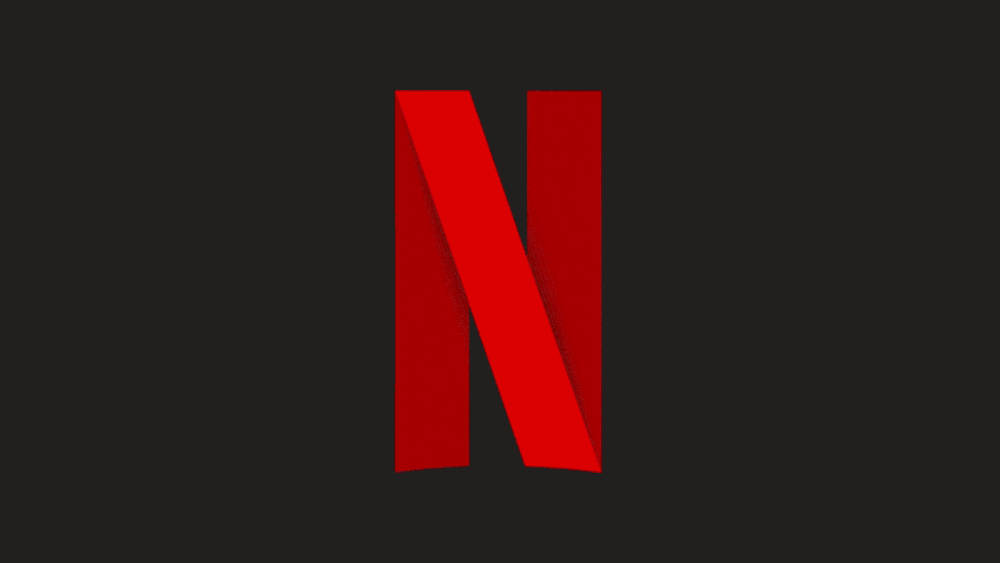

##### **Project Type**    - *Unsupervised*
##### **Contribution**    - *Team*
##### **Team Member 1 -** **Pratik Jori**
##### **Team Member 2 -** **Pritesh Tambat**

# **Project Summary -** ✍

Netflix is an American technology and media servieces provider and production company.It's headquarter based in Los Gatos, California. Netflix was founded in 1997 by Reed Hasting and Marc Randolph in Scott Valley, California, Company is subscription based streaming service, which offers online streaming of library of Tv Shows and Movies, including there own production in house.

Netflix is a popular platform that people across the world used for the entertainment. It is subscription aervice model that gives the personalized recommendations, to the viwers to findout the shows and movies of there intrest. They uses the contetn details and appilcation usage data to make the recommendation to each other.

In order to build that recommendation system engines, grouping and analysis the content catalogue may prove to be extremely usefull. NEtflix witheld the competiton to creat an algorithm to accuratly predicts the how much a viwer would like movie based on their prefrences. Netflix has expanded the use of data more than the rating forecasting and into the variety of areas such as, personalised ranking, page generation, search and marketing. Netflix Recommendation Engine is composed of algorithms that select the content based on each users unique profile. This engine have filter over 3000 titles at once utilisung 1300 recommendation cluster based on the user prefrences. The engines precise recommendations account for 80% of the Netflix viewer activity, According to reports Netflix saves over 1 billion dollars annually by the Netflix Recommendation Engine.

We all know that the Netflix has grown over the years. From the dataset we can see that the company has take a certain approches to improve there marketing and content uploading stratagies. Company has grown lastly because it decided that to expand to international market. We have seen that the good amount of TV Shows and Movies are released as part of Netflix over the years in there global expansion.

The problem statement was to build the clustering algoritham and we also build the recommendation system for the Netflix TV Shows and Movies. First, we implement the data and overview on the data , The Netflix dataset contains data of 7787 video content listed on the platform collected from Flixable, a third party Netflix search engine. this dataset consist of 12 attribute, providing content details about videos.Then we check the data type, missing/null values and data description.


We started with data wrangling in which we try to handle the missing/null values, outlier next we done Exploratory Data Analysis is the most commanly used methodology to summarize and visualize the data using parameters. we do EDA on the dataset and from that we draw some observations. We find the correlation between the content watch in the respective countries on the basis of rating. We have done some hypothesis testing on the data.

After that we done the preprocessing of the data for clustering in which we have done text preprocessing as removing punctuation marks, stopwords, convert all textual data to lowercase. Then we done word vectorization and stemming of the data.

We select the attributes on which we want to cluster then we scale the data and apply the clustering algoritham like K-means silhouette method and Elbow method, Hierarchical clustering, countwise clustering.

We also build the content based recommendation system using cosine similartiy. This recommender system will make 10 recommendation to the user based on the show they watched.


# **GitHub Link -** 🔗

Pratik’s Github link:- https://github.com/pratikjori20/Netflix-movies-TV-Shows-Clustring-ML-unsupervised 

Pritesh’s Github link:- https://github.com/pritesh2292/Netflix-Movies-Tv-Shows-Clustering

# **Problem Statement** 🤔


This dataset consists of TV Shows and Movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.
 
**Problem Overview**


*  Netflix is world's largest online streaming provider, with 231 million paid subscriber worldwide as fourth quarter of 2022. It is crucial that they cluster the show hosted on netflix platform in order to enhance the user experience.

*  We will be able to understand that the TV shows and Movies are similar to and different from each other by creating the cluster, which will help the consumer personalized there watching show and movies suggestions depending on there preferences.

*  The main objective of this project is implement the machine learning algorithm for the clustering the the Netflix content such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.



# ***Let's Begin !***

## ***1. Know Your Data*** : 🔍

### Import Libraries

In [ ]:
# Import Libraries
# importing all necessory libraries and
# install packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import missingno as msno
import plotly.express as px
%matplotlib inline

import re
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from nltk.tokenize import TweetTokenizer
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# mount the  drive on colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load Dataset

path = '/content/drive/MyDrive/ML Unsupervised /NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv'

df = pd.read_csv(path)

### Dataset First View

In [ ]:
# Dataset First Look

df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count

df.shape

(7787, 12)

### Dataset Information

In [ ]:
# Dataset Info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count

df_duplicated = df[df.duplicated()]
print("Let's see which columns contains dupilcate values rows")
df_duplicated

Let's see which columns contains dupilcate values rows


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description


*   There is ***no duplicated*** values present in the dataset.

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count

null = pd.DataFrame({'No of Total values': df.shape[0] , 'No of NaN Values': df.isnull().sum(),
                     '% of NaN values': round((df.isnull().sum()/df.shape[0])*100, 2)})
null.sort_values('No of NaN Values', ascending = False)

,No of Total values,No of NaN Values,% of NaN values
director,7787,2389,30.68
cast,7787,718,9.22
country,7787,507,6.51
date_added,7787,10,0.13
rating,7787,7,0.09
show_id,7787,0,0.00
type,7787,0,0.00
title,7787,0,0.00
release_year,7787,0,0.00
duration,7787,0,0.00


*   ***director*** column has highest ***30.68%*** NaN values
*   ***cast*** column has ***9.22%*** NaN values
*   ***country***, ***date_added***, ***rating*** columns also containing NaN values

In [ ]:
df.isna().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
# ploting null values present in dataset

nan = df.isna()
nan.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,False,False,False,True,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False


<Axes: >

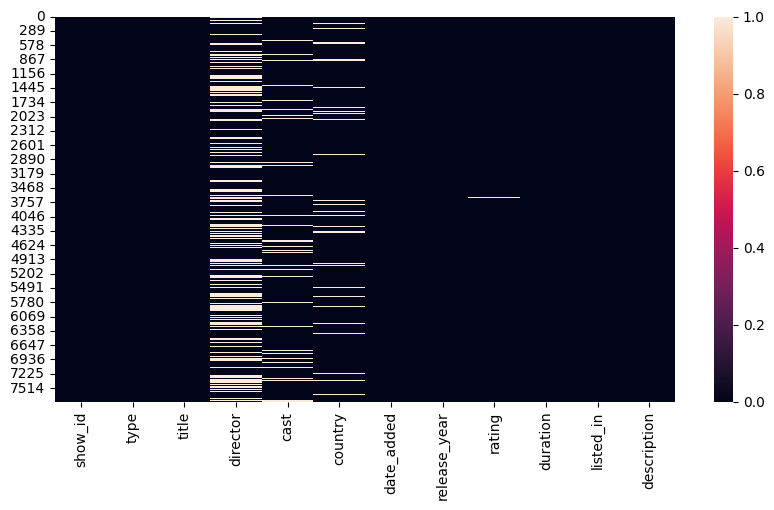

In [ ]:
# Visualizing the missing values

plt.figure(figsize = (10,5))
sns.heatmap(nan)

### What did you know about your dataset?

* The given dataset is consist the TV shows and Movies available on Netflix as of 2019. This dataset is about the content that is present on the Netflix platform and the details of it like title, cast, director, release year, rating etc.

* The dataset consist 12 columns and 7787 rows in it and data is in textual from that is object data type and only release year column is numerical type.


* Dataset does not content any duplicate values but it has some missing values/ null values in it. So we need to treat the all neccesory process and NLP before applying the clutering algorithms.

## ***2. Understanding Your Variables*** 🤓

In [ ]:
# Dataset Columns

df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe

df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


*  as we see in the dataframe that only '*release_year*' column contains the numeric data so it showing only that columns describtion.

In [ ]:
df.describe(include= 'O').T

,count,unique,top,freq
show_id,7787,7787,s1,1
type,7787,2,Movie,5377
title,7787,7787,3%,1
director,5398,4049,"Raúl Campos, Jan Suter",18
cast,7069,6831,David Attenborough,18
country,7280,681,United States,2555
date_added,7777,1565,"January 1, 2020",118
rating,7780,14,TV-MA,2863
duration,7787,216,1 Season,1608
listed_in,7787,492,Documentaries,334


### Variables Description 

1.  **show_id** : *Unique ID for every Movie / Tv Show*

2.  **type** : *Identifier - A Movie or TV Show*

3.  **title** : *Title of the Movie / Tv Show*

4.  **director** : *Director of the Movie / TV Show*

5.  **cast** : *Actors involved in the movie / show*

6.  **country** : *Country where the movie / show was produced*

7.  **date_added** : *Date it was added on Netflix*

8.  **release_year** : *Actual Release year of the movie / show*

9.  **rating** : *TV Rating of the movie / show*

10.  **duration** : *Total Duration - in minutes or number of seasons*

11.  **listed_in** : *Genre*

12.  **description**: *The Summary description*

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.

df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling*** ✍

### Data Wrangling Code

In [ ]:
# creating dataset copy
df_copy = df.copy()

In [ ]:
# handling the missing values

df_copy['director'].fillna('unknown', inplace =True)
df_copy['cast'].fillna('unknown', inplace =True)
df_copy['country'].fillna('unknown', inplace =True)
df.dropna(subset=['date_added', 'rating'], axis=0, inplace=True)

In [ ]:
# converting date_added column to datetime 
df_copy['date_added'] = pd.to_datetime(df_copy['date_added'])

In [ ]:
df_copy ['listed_in'] = df_copy.listed_in.apply(lambda row: row.split(', '))
df_copy.explode('listed_in')['listed_in'].unique()

array(['International TV Shows', 'TV Dramas', 'TV Sci-Fi & Fantasy',
       'Dramas', 'International Movies', 'Horror Movies',
       'Action & Adventure', 'Independent Movies', 'Sci-Fi & Fantasy',
       'TV Mysteries', 'Thrillers', 'Crime TV Shows', 'Docuseries',
       'Documentaries', 'Sports Movies', 'Comedies', 'Anime Series',
       'Reality TV', 'TV Comedies', 'Romantic Movies',
       'Romantic TV Shows', 'Science & Nature TV', 'Movies',
       'British TV Shows', 'Korean TV Shows', 'Music & Musicals',
       'LGBTQ Movies', 'Faith & Spirituality', "Kids' TV",
       'TV Action & Adventure', 'Spanish-Language TV Shows',
       'Children & Family Movies', 'TV Shows', 'Classic Movies',
       'Cult Movies', 'TV Horror', 'Stand-Up Comedy & Talk Shows',
       'Teen TV Shows', 'Stand-Up Comedy', 'Anime Features',
       'TV Thrillers', 'Classic & Cult TV'], dtype=object)

### What all manipulations have you done and insights you found?

*  We have apply the ***fillna*** and ***dropna*** method for the attributes that content the null or missing values.

*  We convert date added attribute as ***datetime*** Dtype

## ***4. Exploratory Data Analysis***  📉

#### Chart - 1 -  Types of Contents on Netflix

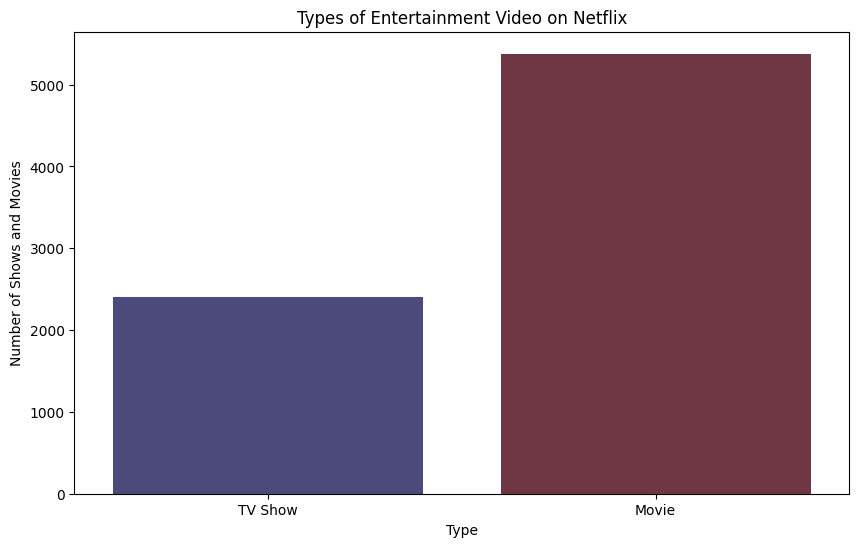

In [ ]:
# Chart - 1 Types of video present on Netflix

plt.figure(figsize=(10,6))
sns.countplot(x=df_copy['type'], data=df_copy, palette='icefire')
plt.xlabel('Type')
plt.ylabel('Number of Shows and Movies')
plt.title('Types of Entertainment Video on Netflix')
plt.show();

In [ ]:
content = df_copy['type'].value_counts()
content

Movie      5377
TV Show    2410
Name: type, dtype: int64

##### 1. Why did you pick the specific chart?

*  We need the check which type has higher number of videos or the content on the Netflix.

##### 2. What is/are the insight(s) found from the chart?

*  From the chart we know that the ***highest number*** of videos present on the Netflix is from ***Movies*** type, it has almost the double of the videos that present in the TV show type.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This will help the company to understand the which type has more content in it on there platform and it will help to improve in certain aspect to reach there desirable goals.

#### Chart - 2 - Types of Netflix Content

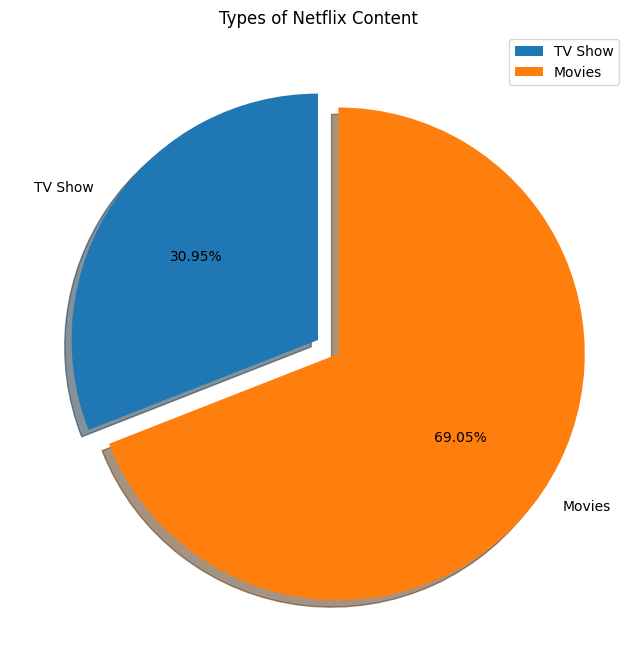

In [ ]:
# Chart - 2 ploting the pie chart for type feature

plt.figure(figsize=(14,8))
labels=['TV Show', 'Movies']
explode = [0, 0.1]
plt.pie(content.sort_values(),labels=labels, autopct ='%1.2f%%', explode = explode, shadow = True, startangle = 90)
plt.title('Types of Netflix Content')
plt.legend()
plt.show();

##### 1. Why did you pick the specific chart?

* To better visualize the content that present in the TV shows and Movies we plot the pie chart.

##### 2. What is/are the insight(s) found from the chart?

* There is around ***69%*** videos present that are ***Movies*** and remaining ***31%*** is as ***TV Show***.
*  From the pie chart we can see that the movies having the highest no of content than the tv shows. 

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This will help to understand the process well in less time of period and it give more insight of the observation to the company

#### Chart - 3 - Rating of Content on Netflix

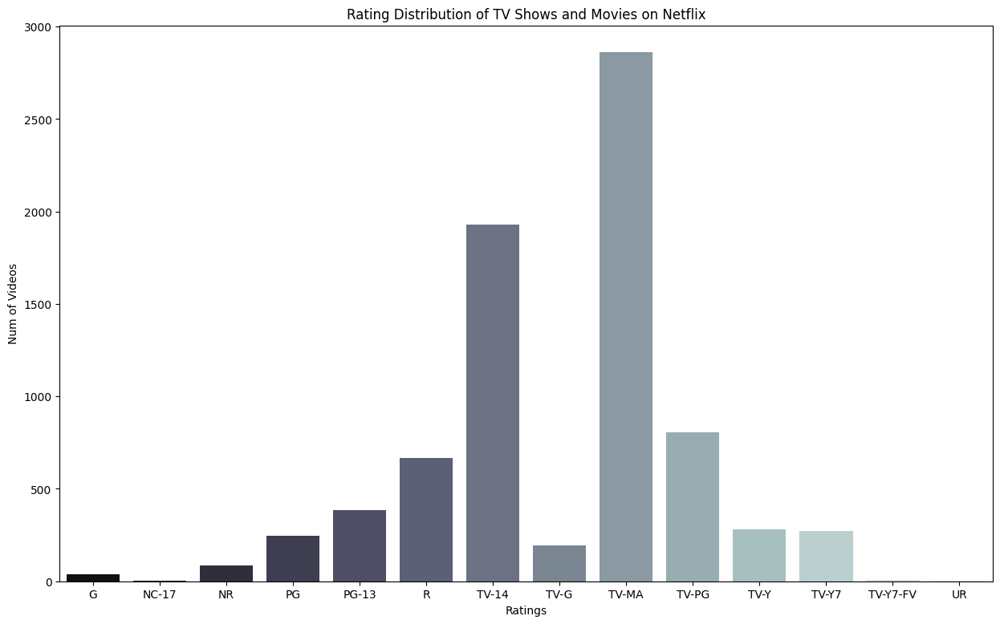

In [ ]:
# Chart - 3 visualization code
# rating on the netflix

plt.figure(figsize=(15,9))
a = df_copy.groupby('rating').agg({'show_id':'count'}).reset_index()
sns.barplot(x=a['rating'], y=a['show_id'], palette='bone')
plt.xlabel('Ratings')
plt.ylabel('Num of Videos')
plt.title('Rating Distribution of TV Shows and Movies on Netflix')
plt.show();

##### 1. Why did you pick the specific chart?

*  To check the rating distribution of TV Shows and Movies on Netflix we plot this barplot.

##### 2. What is/are the insight(s) found from the chart?

*  Most of the content on Netflix is rated for ***above 14 year old*** audiance.
*  From the barplot we see that the most of the content present on the Netflix is for adult and the above 14 year old audiance

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This will help the company to understand the which rating has more numbers of content availables on there platform and can imorove on there aspect of producing the ratingwise content on Netflix.

#### Chart - 4 - Release Year of Content on Netflix

<Figure size 1500x900 with 0 Axes>

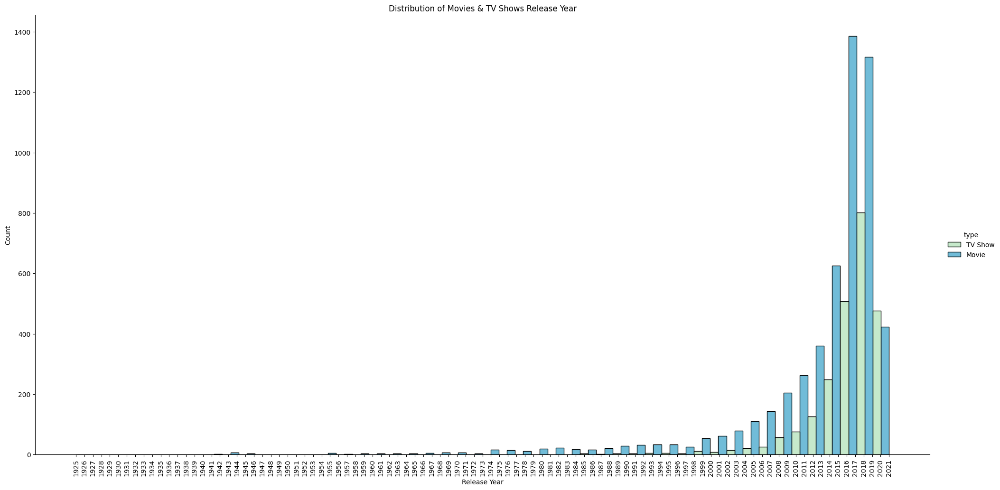

In [ ]:
# Chart - 4 visualization code
# histogram for release dates of movies and tv shows

ticks=np.arange(df_copy.release_year.min(), df_copy.release_year.max()+1,1)
plt.figure(figsize=(15,9))
sns.displot(x='release_year', data= df_copy, kind='hist', height=10, aspect=2, bins=50, hue='type', multiple='dodge', palette='GnBu')
plt.xticks(ticks, rotation=90)
plt.xlabel('Release Year')
plt.title('Distribution of Movies & TV Shows Release Year')
plt.show();

##### 1. Why did you pick the specific chart?

*  We plot the chart to find out the distribution of Movies & TV Shows Release Year.

##### 2. What is/are the insight(s) found from the chart?

* Most of the ***movies*** were released on the platform after ***2012***
* Most of the ***TV Shows*** were released on the platform after ***2015***
* Highest number of ***Movies*** and ***TV Shows*** were released on the platform on **2017** year
* From above observations we can see that the Netflix has been increasingly focusing on TV Shows rathar than the Movies in recent year.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This will help the company to understand the number of content that available on the platform is released on which year and the which type is on more focus in recent years from Netflix.


#### Chart - 5 - Distribution Duration of Movies

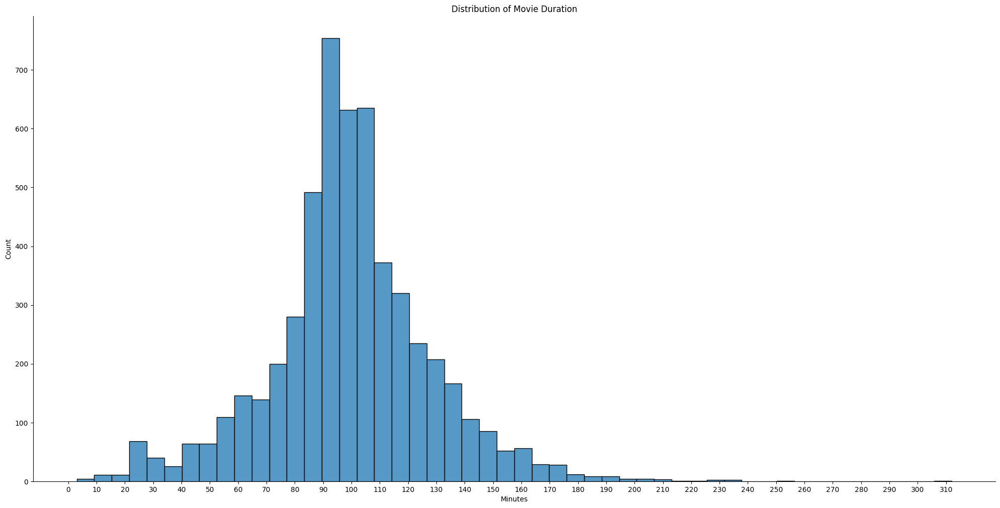

In [ ]:
# Chart - 5 visualization code

# ploting the duration time for the movies
t = df_copy[df_copy['type']=='Movie'].loc[:,['show_id', 'duration']].copy()
cast = (t['duration'].to_list())

newlist =[]
for genre in cast:
  newlist.append(int(genre.split(' ')[0]))
country_list = pd.DataFrame({'Duration': newlist, 'id': np.arange(0,len(newlist),1)})
sns.displot(x='Duration', data=country_list, kind='hist', height=10, aspect=2, bins=50)
plt.xlabel('Minutes')
plt.xticks(ticks=np.arange(0,country_list.Duration.max()+1,10))
plt.title('Distribution of Movie Duration')
plt.show();

##### 1. Why did you pick the specific chart?

*  We visualize from this chart distribution of Movie Duration(time).

##### 2. What is/are the insight(s) found from the chart?

* The highest duration is about ***90*** to ***110*** ***min*** for movies
* From this distribution of movies length ranges from ***3 min to 312 min*** and from chart we can see that the distribution is almost normally distributed

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* Above chart shows the average duration of movies distribution it will help to understand the what is most common time duration is available on the platform

#### Chart - 6 - Distribution Season of TV Shows

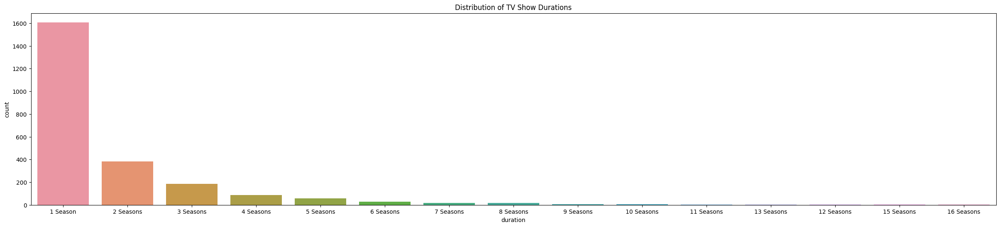

In [ ]:
# Chart - 6 visualization code
# duration of Tv Shows
tv_show = df_copy[df_copy['type']== 'TV Show']
plt.figure(figsize= (30,6))
sns.countplot(x = tv_show['duration'], data= tv_show, order = tv_show['duration'].value_counts().index)
plt.title('Distribution of TV Show Durations')
plt.show();

##### 1. Why did you pick the specific chart?

*  We visualize from this chart distribution of TV shows Duration(Seasons).

##### 2. What is/are the insight(s) found from the chart?

*  Highest number of TV Shows are having only ***one season***.
*  From the chart TV shows present on Netflix vaires from ***1 season to 16 seasons***.
*  There is very few TV shows that have more than ***Eight seasons***.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* The above chart will help the company to visualize that the how much avg seasons are uploaded in TV Show type. It will help to gain insight that the how many seasons are released by the TV series.

#### Chart - 7 - Production Growth Yearly

In [ ]:
# preaparing data to visualize the chart

year_movie = df_copy[df_copy.type =='Movie']['release_year'].value_counts().sort_index(ascending=False).head(10)
year_show = df_copy[df_copy.type =='TV Show']['release_year'].value_counts().sort_index(ascending=False).head(10)
total = df_copy['release_year'].value_counts().sort_index(ascending=False).head(10)

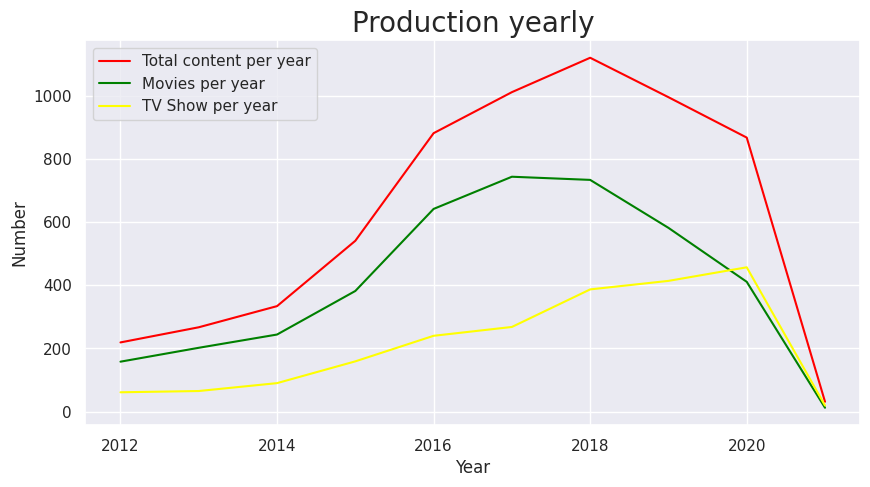

In [ ]:
# Chart - 7 visualization code
# visualizing the growth of production yearly for type of the content

sns.set(font_scale = 1)
total.plot(figsize=(10,5), linewidth= 1.5, color='red', label='Total content per year')
year_movie.plot(figsize=(10,5), linewidth= 1.5, color='green', label='Movies per year')
year_show.plot(figsize=(10,5), linewidth= 1.5, color='yellow', label='TV Show per year')
plt.xlabel('Year')
plt.ylabel('Number')
plt.legend()
plt.title('Production yearly', fontsize=20)
plt.show();

##### 1. Why did you pick the specific chart?

* We plot the chart to check the production growth based on type of the content and release year.

##### 2. What is/are the insight(s) found from the chart?

*  Production of the total no of content on Netflix is higher on the year of ***2018***.

*  Production of the Movies on Netflix is higher from ***2016*** to ***2018*** year.

*  Production of TV Shows on Netflix is higher from ***2018*** to **2020** year.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* The chart is help to understand the company that the Movies and TV Shows production how much grows yearly and which type production is significantly grows in years. And also the total production of the years.

#### Chart - 8 - Top Content Producing Countries

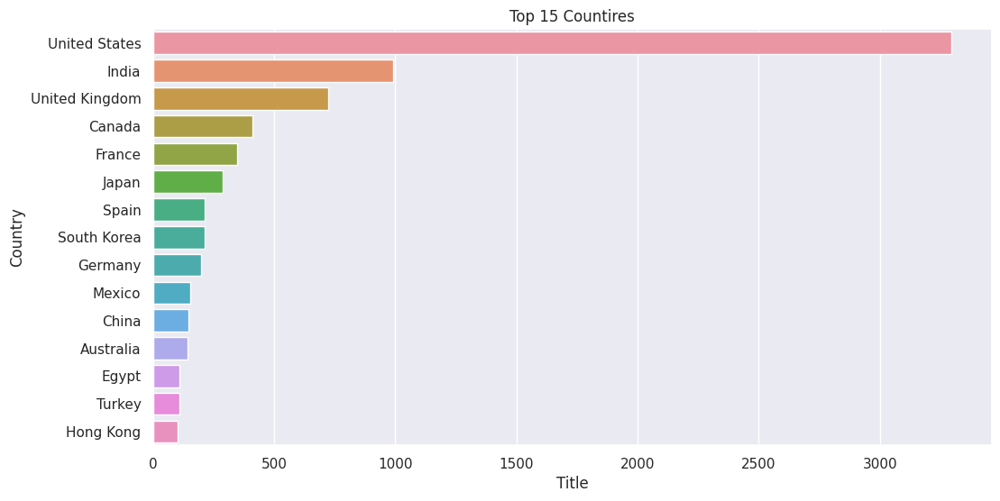

In [ ]:
# Chart - 8 visualization code
# Countires by the content produce on netflix

countries = df_copy.set_index('title').country.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
countries = countries[countries != 'unknown']
plt.figure(figsize=(12,6))
sns.countplot(y=countries, order=countries.value_counts().index[:15])
plt.xlabel('Title')
plt.ylabel('Country')
plt.title('Top 15 Countires')
plt.show();

In [ ]:
#distribution according to countries

top_rated=df[0:10]
fig =px.sunburst(top_rated,path=['country'])
fig.show()

##### 1. Why did you pick the specific chart?

* To check the countires by the content produce on Netflix we plot the bar and pie chart.

##### 2. What is/are the insight(s) found from the chart?

* From the chart we can see the top 15 countries contributed on netflix and ***United State*** is highest number of content created country on the netflix followed by ***India***.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* The charts is help the company to better understanding the which country has more content produce on Netflix platform and improve there marketing strategy in repective countries.

#### Chart - 9 - Content Producing Countries Globaly

In [ ]:
# Chart - 9 visualization code
# distribution of content on basis of countries

country_all = df.groupby(['country','type']).count()['show_id'].reset_index()
country_count = {}
for i in range(len(country_all)):
    c = country_all['country'][i].split(', ')
    for x in c:
        x = re.sub('[^A-Za-z0-9 ]+', '', x)
        if x not in country_count.keys():
            country_count[x] = country_all['show_id'][i]
        else:
          country_count[x] += country_all['show_id'][i]
country_df = pd.DataFrame(list(zip(country_count.keys(), country_count.values())), columns =['country', 'count'])
#visualization
iplot([go.Choropleth(locations = list(country_count.keys()),
            locationmode='country names',
            z = list(country_count.values()),
            text = country_df['country'])])

##### 1. Why did you pick the specific chart?

* We plot distribution of content on basis of countries on the world map.

##### 2. What is/are the insight(s) found from the chart?

*  We can see from the world map that which country produces the how much content.
*  From the chart we can see that ***United State*** produces the highets number of content followed by the ***India***

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This chart have shows the content producing countries on the global map. It will help the company to better understanding of the which countries have more content. and help the insight for company to take business decisions related to production, distribution and marketing.

#### Chart - 10 - Top Directors

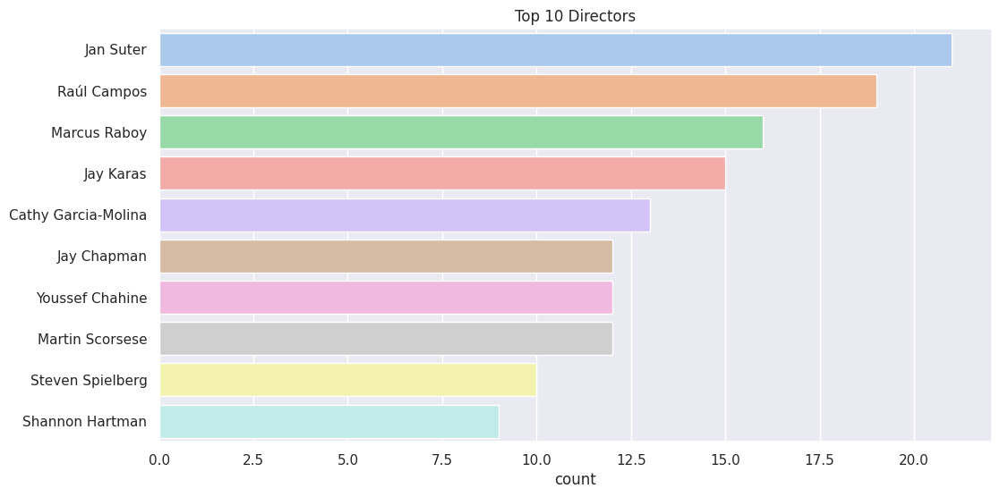

In [ ]:
# Chart - 10 visualization code

# Top directors or popular directors on netflix

directors = df_copy[df_copy.director != 'unknown'].set_index('title').director.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
plt.figure(figsize=(12,6))
sns.countplot(y=directors, order=directors.value_counts().index[:10], palette='pastel')
plt.title('Top 10 Directors')
plt.show();

##### 1. Why did you pick the specific chart?

*  We visualize the Top directors or popular directors present on Netflix

##### 2. What is/are the insight(s) found from the chart?

* We can see that the top 10 directors are on Netflix with most number of content are mostly ***International***.
* ***Jan Suter*** is top director with high no of content directed on netflix.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This will help the industry to undersrtand the top ten directors that directed the content on Netflix. It will help the insight that the reach out the popular directors for the future content directions that will produce under netflix production,

#### Chart - 11 -Top Actors

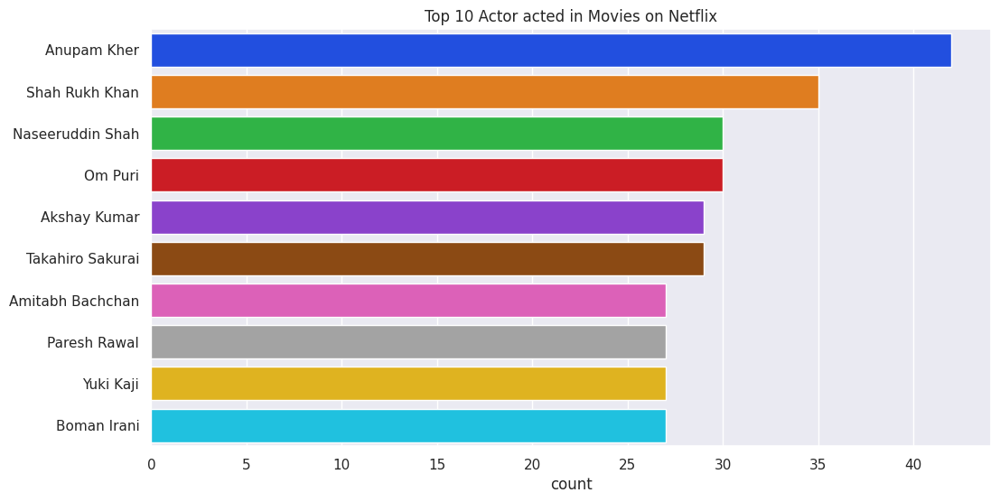

In [ ]:
# Chart - 11 visualization code
# Top 10 actors in movies based on number movies acted in

cast_movies = df_copy[df_copy.cast != 'unknown'].set_index('title').cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
plt.figure(figsize=(12,6))
sns.countplot(y=cast_movies, order=cast_movies.value_counts().index[:10], palette='bright')
plt.title('Top 10 Actor acted in Movies on Netflix')
plt.show();

##### 1. Why did you pick the specific chart?

*  We Visualize the Top 10 actors in movies based on number movies acted in on the Netflix

##### 2. What is/are the insight(s) found from the chart?

* Highest number of actors are ***Indian*** in the top 10 actors acted in movies present on the Netflix.
* Top actor who acted highest no of movies is ***Anupam Kher*** followed by ***Shah Rukh Khan***.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* Above chart help the industry to know the which top ten actors are acted in content that present on the Netflix. It will help the industry to understand the popularity of the actors that acted in mostly content on netflix.

#### Chart - 12 - Top Genre

Text(0.5, 1.0, 'Top 10 Genres of Movies')

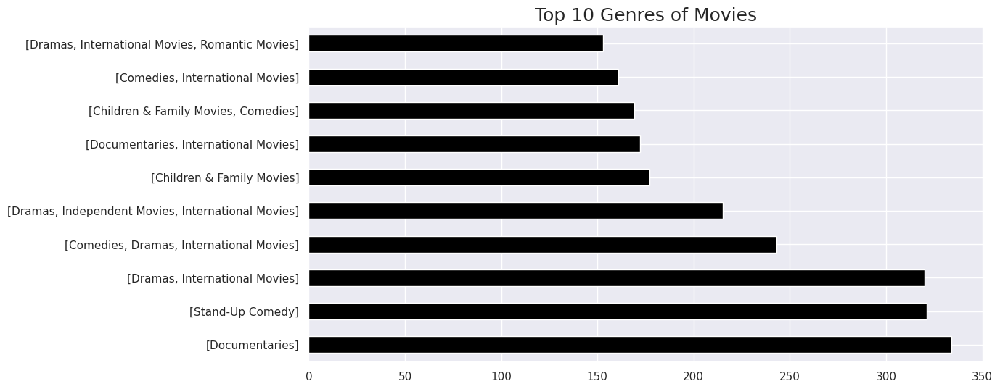

In [ ]:
# Chart - 12 visualization code
# Top 10 genre of movies on netflix

plt.figure(figsize=(12,6))
df_copy[df_copy["type"]=="Movie"]["listed_in"].value_counts()[:10].plot(kind="barh",color="black")
plt.title("Top 10 Genres of Movies",size=18)

##### 1. Why did you pick the specific chart?

We visualize the barplot to see Top 10 genre of movies present on Netflix.

##### 2. What is/are the insight(s) found from the chart?

*  Top genre that content highets number of content on Netflix is ***Documentaries***.
*  ***Stand-Up Comedy*** and ***Dramas, International Movies*** genre contains are equal number of content.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* This chart help the Netflix to understand the which genre has more content present on the platform. And it give insight to improve the growth of the content streaming by uploading the popular genre more on platform.

#### Chart - 13 - Words Present in Title

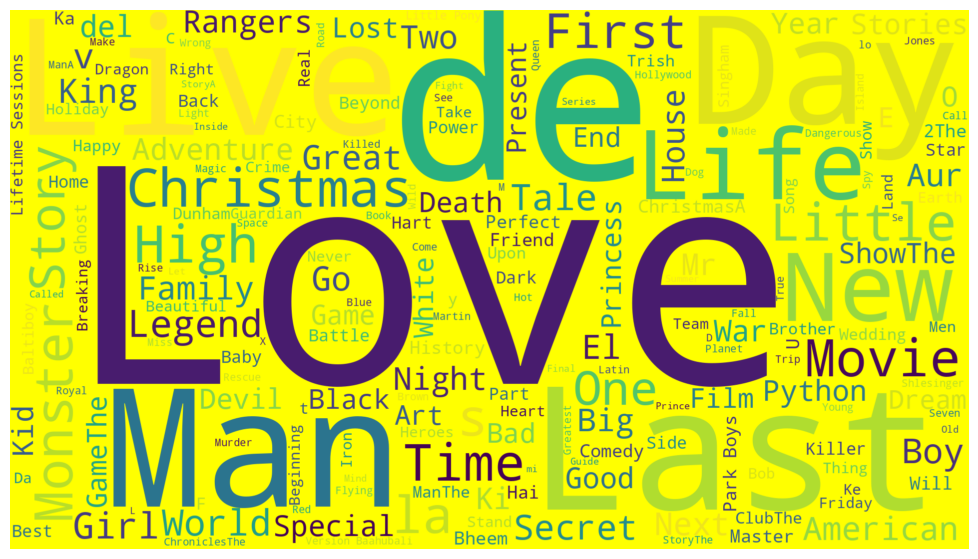

In [ ]:
# Chart - 13 visualization code

# most occured word in title

word_cloud = df_copy['title']
text = ''. join(word for word in word_cloud)

# stop word list
stopword = set(STOPWORDS)

# word cloud image

word = WordCloud(stopwords= stopword, background_color='Yellow',width=1920,height=1080).generate(text)
plt.rcParams['figure.figsize']=(15,7)
plt.imshow(word, interpolation='bilinear')
plt.axis('off')
plt.show()

##### 1. Why did you pick the specific chart?

* To check the most occured word in title we plot worldcloud.

##### 2. What is/are the insight(s) found from the chart?

* It look like words like '***Love***', '***Last***', '***Man***', '***de***' are most used in titles.
* There is word '***Christmas***' also occured maybe those movies are released on December.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* this chart or the wordcloud image helps the Netflix to identify the frequent words that used in titles, Netflix could used its search engine algorithm to return more accurate results. It will help the industry to build the best recommender that provide more personalized experience for the users, that will help the Netflix to increase the subscribers.

#### Chart - 14 - Correlation Heatmap

In [ ]:
# preparing data for heatmap

rating_age = {'TV-PG': 'Older Kids', 'TV-MA': 'Adults', 'TV-Y7-FV': 'Older Kids', 
          'TV-Y7': 'Older Kids', 'TV-14': 'Teens', 'R': 'Adults', 'TV-Y': 'Kids',
          'NR': 'Adults', 'PG-13': 'Teens', 'TV-G': 'Kids', 'PG': 'Older Kids', 
          'G': 'Kids', 'UR': 'Adults', 'NC-17': 'Adults'}

df_copy['rating_age'] = df_copy['rating'].replace(rating_age)

In [ ]:
# data for correlation

df_copy['count'] = 1
heatmap = df_copy.groupby('country')[['country', 'count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
heatmap = heatmap[heatmap != 'unknown']
heatmap = heatmap['country']

corr = df_copy.loc[df_copy['country'].isin(heatmap)]
corr = pd.crosstab(corr['country'], corr['rating_age'], normalize = 'index').T
corr

country,Canada,Egypt,France,India,Japan,South Korea,Spain,United Kingdom,United States
rating_age,,,,,,,,,
Adults,0.446328,0.277228,0.678261,0.255688,0.364444,0.469945,0.835821,0.513854,0.501959
Kids,0.180791,0.000000,0.095652,0.016251,0.008889,0.027322,0.022388,0.093199,0.073276
Older Kids,0.225989,0.039604,0.060870,0.160347,0.271111,0.120219,0.044776,0.204030,0.187696
Teens,0.146893,0.683168,0.165217,0.567714,0.355556,0.382514,0.097015,0.188917,0.237069


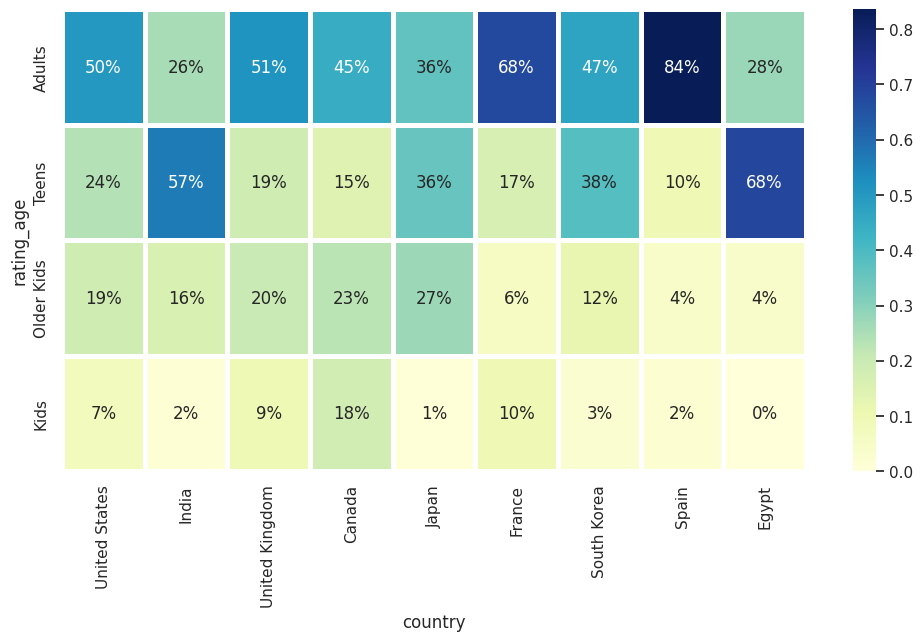

In [ ]:
# Correlation Heatmap visualization code

countries =['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Egypt']
rating = ['Adults', 'Teens', 'Older Kids', 'Kids']

plt.figure(figsize=(12,6))
sns.heatmap(corr.loc[rating, countries], cmap='YlGnBu', linewidth=2.5, fmt='1.0%', annot_kws={'fontsize':12}, annot=True)
plt.show()

##### 1. Why did you pick the specific chart?

We visualize the correlation between the countries and rating of streaming content on Netlfix.

##### 2. What is/are the insight(s) found from the chart?

*  The ***United state*** and ***United Kingdom*** are close to correlate the rating age means both countries people prefers to watch similar type of content.

## ***5. Hypothesis Testing***  ❓

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

1. movies for kids and older kids are having at least two hours long.
2. movies for kids and older kids are not having two hours long.

#### 2. Perform an appropriate statistical test.

In [ ]:
hypothesis = df_copy

In [ ]:
hypothesis['rating'].unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', nan,
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

In [ ]:
hypothesis = hypothesis[hypothesis['type'] == 'Movie']

rating_age = {'TV-PG': 'Older Kids', 'TV-MA': 'Adults', 'TV-Y7-FV': 'Older Kids', 
          'TV-Y7': 'Older Kids', 'TV-14': 'Teens', 'R': 'Adults', 'TV-Y': 'Kids',
          'NR': 'Adults', 'PG-13': 'Teens', 'TV-G': 'Kids', 'PG': 'Older Kids', 
          'G': 'Kids', 'UR': 'Adults', 'NC-17': 'Adults'}

hypothesis['ages'] = hypothesis['rating'].replace(rating_age)
hypothesis['ages'].unique()

array(['Adults', 'Teens', 'Older Kids', 'Kids', nan], dtype=object)

In [ ]:
hypothesis['ages'] = pd.Categorical(hypothesis['ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])
hypothesis['duration'] = hypothesis['duration'].astype(str).str.extract('(\d+)')
hypothesis['duration'] = pd.to_numeric(hypothesis['duration'])

In [ ]:
group_by = hypothesis[['duration', 'ages']].groupby(by='ages')

group = group_by.mean().reset_index()
group

,ages,duration
0,Kids,66.486891
1,Older Kids,92.024648
2,Teens,110.025332
3,Adults,98.275145


In [ ]:
K = group_by.get_group('Kids')
O = group_by.get_group('Older Kids')

K_M = K.mean()
K_S = K.std()

O_M = O.mean()
O_S = O.std()
print('Movies rated for Kids Mean{}\nMovies rated for older kids Mean{}'.format(K_M,O_M))
print('Movies rated for Kids Std{}\nMovies rated for older kids Std{}'.format(K_S,O_S))

Movies rated for Kids Meanduration    66.486891
dtype: float64
Movies rated for older kids Meanduration    92.024648
dtype: float64
Movies rated for Kids Stdduration    31.739465
dtype: float64
Movies rated for older kids Stdduration    31.182577
dtype: float64


In [ ]:
# Perform Statistical Test to obtain t-Value

K_n = len(K)
O_n = len(O)
print(K_n, O_n)

dof = K_n + O_n - 2
print('dof', dof)

sp_2 = ((O_n-1)*K_S**2 + (K_n-1)*O_S**2)/dof
print('SP 2 =', sp_2)

sp = np.sqrt(sp_2)
print('SP', sp)

t_value = (K_M - O_M)/(sp*np.sqrt(1/K_n + 1/O_n))
print('tvalue', t_value[0])

267 852
dof 1117
SP 2 = duration    999.049147
dtype: float64
SP duration    31.607739
dtype: float64
tvalue -11.51992627853396


In [ ]:
# t-distribution
stats.t.ppf(0.025,dof)

-1.9620900365868952

In [ ]:
# t-distribution
stats.t.ppf(0.975,dof)

1.9620900365868947

***t-value*** is not in range so the ***null hypothesis*** is ***rejected***.

So, movies rated for kids and older kids are not longer than the two hours.

##### Which statistical test have you done to obtain t-Value?

We used the t.ppf function to calculate the value of t for a given probability (q) and degrees of freedom (df)

##### Why did you choose the specific statistical test?

To get a 95% confidence interval, we need to find the cutoff points that enclose 95% of the probability distribution. This can be done using the t.ppf() function with q values of 0.025 and 0.975 for the lower and upper cutoff points respectively. The degrees of freedom (df) argument is usually the sample size minus 1 for a single population sampling problem.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

1.  More than 90 mins durations are movies

2.  More than 90 mins durations are Not movies

#### 2. Perform an appropriate statistical test.

In [ ]:
hypoth = df_copy

hypoth['duration'] = hypoth['duration'].astype(str).str.extract('(\d+)')
hypoth['duration'] = pd.to_numeric(hypoth['duration'])

In [ ]:
hypoth['type'] = pd.Categorical(hypoth['type'], categories=['Movie', 'TV Show'])

group_by = hypoth[['duration', 'type']].groupby(by='type')
group = group_by.mean().reset_index()
group

,type,duration
0,Movie,99.307978
1,TV Show,1.775934


In [ ]:
M = group_by.get_group('Movie')
S = group_by.get_group('TV Show')

M_m = M.mean()
M_s = M.std()

S_m = S.mean()
S_s = S.std()

print('Mean {}'.format(M_m, S_m))
print('Std {}'.format(M_s, S_s))

Mean duration    99.307978
dtype: float64
Std duration    28.530881
dtype: float64


In [ ]:
# Perform Statistical Test to obtain t-Value

M_n = len(M)
S_n = len(S)
print(M_n, S_n)

dof = M_n + S_n - 2
print('dof',dof)

sp_2 = ((S_n-1)*M_s**2 + (M_n-1)*S_s**2)/dof
print('SP_2 =',sp_2)

sp = np.sqrt(sp_2)
print('SP',sp)

t_val = (M_m - S_m)/(sp*np.sqrt(1/M_n + 1/S_n))
print('tvalue', t_val[0])

5377 2410
dof 7785
SP_2 = duration    253.64841
dtype: float64
SP duration    15.926343
dtype: float64
tvalue 249.81856492927665


In [ ]:
stats.t.ppf(0.025, dof)

-1.9602687544602204

In [ ]:
stats.t.ppf(0.975, dof)

1.96026875446022

***t-value*** are not in range so the ***null hypothesis*** is ***rejected***.

So, from that the duration more than the 90 min are movies.

##### Which statistical test have you done to obtain P-Value?

We used the t.ppf function to calculate the value of t for a given probability (q) and degrees of freedom (df)

##### Why did you choose the specific statistical test?

To get a 95% confidence interval, we need to find the cutoff points that enclose 95% of the probability distribution. This can be done using the t.ppf() function with q values of 0.025 and 0.975 for the lower and upper cutoff points respectively. The degrees of freedom (df) argument is usually the sample size minus 1 for a single population sampling problem.

## ***6. Feature Engineering & Data Pre-processing*** 💻

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation

#### What all missing value imputation techniques have you used and why did you use those techniques?

* We have used ***fillna*** and ***dropna*** method for the missing values before starting the EDA.

### 2. Handling Outliers

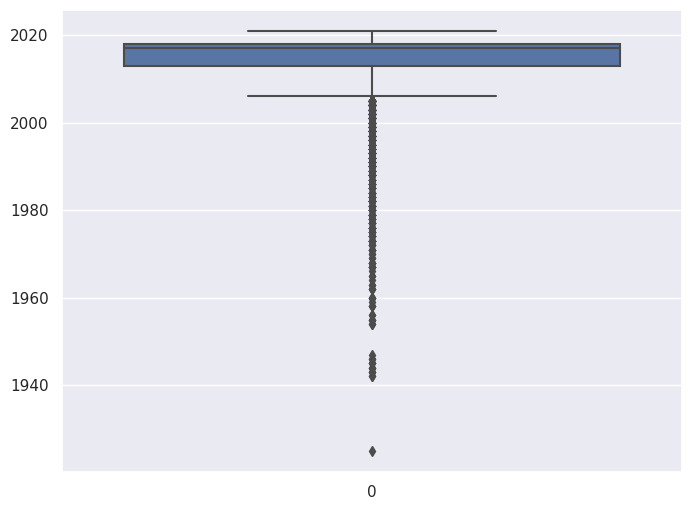

In [ ]:
# Handling Outliers & Outlier treatments
# outlier in release year
plt.figure(figsize=(8,6))
sns.boxplot(df_copy.release_year)
plt.show()

In [ ]:
# replacing ouylier with mean value

Q1 = df_copy.release_year.quantile(0.25)
Q3 = df_copy.release_year.quantile(0.75)
IQR = Q3 - Q1
print(f'release_year Q1 ={Q1}\nrelease_year Q3 = {Q3}\nrelease_year IQR = {IQR}')

release_year Q1 =2013.0
release_year Q3 = 2018.0
release_year IQR = 5.0


*   We don't have release year greater than ***2018***

In [ ]:
outlier = df_copy[(df_copy.release_year < (Q1 - 1.5 * IQR)) | (df_copy.release_year > (Q3 + 1.5 * IQR))]

df_copy['release_year'] = np.where(df_copy['release_year'] <2009, df_copy.release_year.mean(), df_copy['release_year'])

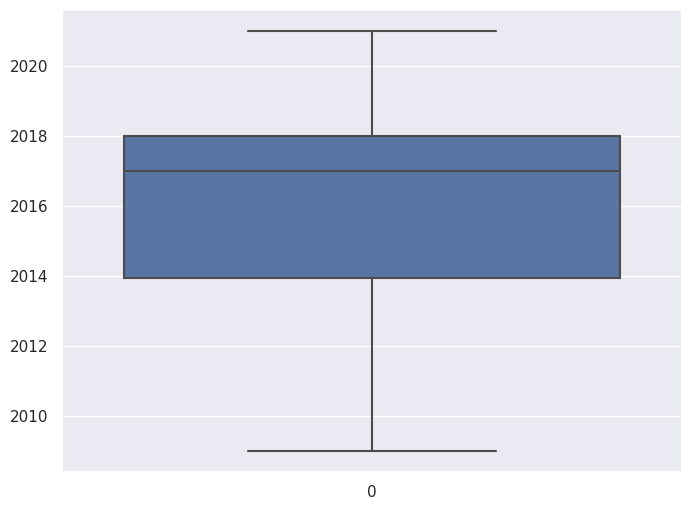

In [ ]:
plt.figure(figsize=(8,6))
sns.boxplot(df_copy.release_year)
plt.show()

##### What all outlier treatment techniques have you used and why did you use those techniques?

The dataset is consist of object data type as it most of the column contain textual data / observation. only the release year consit int data type so we check outlier and treated with ***replacing it with mean value***.

### 3. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
df_copy.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'rating_age', 'count'],
      dtype='object')

In [ ]:
# coverting listed_in into string type
df_copy['listed_in'] = df_copy['listed_in'].apply(lambda x: str(x))

In [ ]:
# creating new column no_category

no_category = []
for categories in df_copy.listed_in.values:
  len_categories = len(categories.split(','))
  no_category.append(len_categories)

In [ ]:
df_copy['no_category'] = no_category
df_copy[['listed_in', 'no_category']].head()

,listed_in,no_category
0,"['International TV Shows', 'TV Dramas', 'TV Sc...",3
1,"['Dramas', 'International Movies']",2
2,"['Horror Movies', 'International Movies']",2
3,"['Action & Adventure', 'Independent Movies', '...",3
4,['Dramas'],1


In [ ]:
df_copy.no_category.value_counts()

3    3298
2    2688
1    1801
Name: no_category, dtype: int64

#### 1. Removing Punctuations

In [ ]:
import string

In [ ]:
# Remove Punctuations

def remove_punct(text):
  ''' this function is used for removing the
  punctuation marks from text'''

  for punctuation in string.punctuation:
    text = text.replace(punctuation, '')
  return text

In [ ]:
df_copy['description'] = df_copy['description'].apply(remove_punct)
df_copy['description'][0:3]

0    In a future where the elite inhabit an island ...
1    After a devastating earthquake hits Mexico Cit...
2    When an army recruit is found dead his fellow ...
Name: description, dtype: object

#### 2. Removing Stopwords & Lower the case

In [ ]:
# Remove Stopwords

nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def delete_stopwords(description):
  ''' this function will take the text data
   as input and delete the stopwords from it.'''

  clean_text= [i.lower() for i in description.split() if i.lower() not in stop_words]
  return ' '.join(clean_text)     # join the list of words with space separator

In [ ]:
df_copy['description'] = df_copy['description'].apply(delete_stopwords)
df_copy['description'][0:3]

0    future elite inhabit island paradise far crowd...
1    devastating earthquake hits mexico city trappe...
2    army recruit found dead fellow soldiers forced...
Name: description, dtype: object

#### 3. Tokenization

In [ ]:
# Tokenization
tokenizer = TweetTokenizer()

#### 4. Text Vectorization

In [ ]:
# Vectorizing Text
# creating the countvectorizer 

count_vect = CountVectorizer()
count_vect.fit(df['description'])
dictionary = count_vect.vocabulary_.items()
dictionary

dict_items([('in', 8068), ('future', 6588), ('where', 17672), ('the', 16185), ('elite', 5226), ('inhabit', 8210), ('an', 796), ('island', 8476), ('paradise', 11645), ('far', 5908), ('from', 6513), ('crowded', 3881), ('slums', 14862), ('you', 18034), ('get', 6778), ('one', 11292), ('chance', 2789), ('to', 16373), ('join', 8669), ('saved', 14045), ('squalor', 15251), ('after', 528), ('devastating', 4453), ('earthquake', 5084), ('hits', 7614), ('mexico', 10215), ('city', 3040), ('trapped', 16581), ('survivors', 15766), ('all', 667), ('walks', 17485), ('of', 11224), ('life', 9363), ('wait', 17464), ('be', 1594), ('rescued', 13393), ('while', 17678), ('trying', 16714), ('desperately', 4406), ('stay', 15355), ('alive', 666), ('when', 17670), ('army', 1061), ('recruit', 13120), ('is', 8466), ('found', 6399), ('dead', 4130), ('his', 7596), ('fellow', 6011), ('soldiers', 14981), ('are', 1023), ('forced', 6340), ('confront', 3458), ('terrifying', 16131), ('secret', 14228), ('that', 16182), ('hau

##### Which text vectorization technique have you used and why?

* We have used the count vectorization technique for the text vectorization. It is one of the simplest way of doing text vectorization.

* Count vectorization fit and learn the word vocabulary and try to create a document term matrix in which the individual cells denote the frequency of that word in a particular document

* We will also using the TF-IDF vectorization which is term frequency-inverse document frequency, it gives a measure that takes the importance of a word into consideration depending on how frequently it occurs in a document.

* TF-IDF is similar to the count vectorization method, in the TF-IDF method, a document term matrix is generated and each column represents an individual unique word.

#### 5. Text Normalization

In [ ]:
# function to lemmatize the corpus

def lemmatize_verb(words):
  lemmatizer = WordNetLemmatizer()
  lemma = []
  for word in words:
    lemmas = lemmatizer.lemmatize(word, pos='v')
    lemma.append(lemmas)
  return lemma

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

vocab = [ ]
count_vocab = []

for key, value in dictionary:
  vocab.append(key)
  count_vocab.append(value)

In [ ]:
# storing the count in pandas dataframe

vocab_stem = pd.DataFrame({'word': vocab, 'count': count_vocab})

vocab_stem = vocab_stem.sort_values('count', ascending=False)    # sort the dataframe

In [ ]:
top_vocab = vocab_stem.head(15)

top_words = top_vocab.word.values
top_words

array(['şeref', 'ōarai', 'łukasz', 'über', 'ömer', 'émile', 'ángel',
       'álvaro', 'álex', 'zé', 'zurich', 'zumbo', 'zulu', 'zuhu',
       'zuckerberg'], dtype=object)

In [ ]:
top_words_count = top_vocab['count'].values
top_words_count

array([18150, 18149, 18148, 18147, 18146, 18145, 18144, 18143, 18142,
       18141, 18140, 18139, 18138, 18137, 18136])

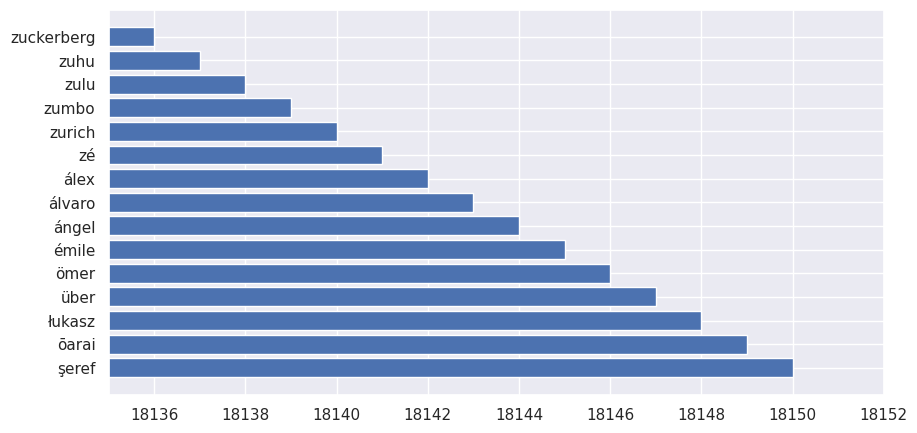

In [ ]:
plt.figure(figsize=(10,5))
plt.barh(top_words, top_words_count)
plt.xlim(18135, 18152)
plt.show()

**Snowball Stemmer**

In [ ]:
# creating stemming function
stemmer = SnowballStemmer('english')

def stemming(text):
  '''function for each words stem in text'''
  text = [stemmer.stem(word) for word in text.split()]
  return ' '.join(text)

In [ ]:
# stemming the description

df_copy['description'] = df_copy['description'].apply(stemming)
df_copy['description'][0:4]

0    futur elit inhabit island paradis far crowd sl...
1    devast earthquak hit mexico citi trap survivor...
2    armi recruit found dead fellow soldier forc co...
3    postapocalypt world ragdol robot hide fear dan...
Name: description, dtype: object

**TF-IDF Vectorization**

In [ ]:
# TfidfVectorizer

# creating the object for Tfid Vectorizer
tfid_vect = TfidfVectorizer()
# fit the vectorizer
tfid_vect.fit(df_copy['description'])
# collect the vocabulary item that used in vectorizer
dictionary = tfid_vect.vocabulary_.items()

In [ ]:
# list to store the vocab and count

vocab = [ ]
count_vocab = []

# iterate through each vocab and count and append to the lists.  
for key, value in dictionary:
  vocab.append(key)
  count_vocab.append(value)

In [ ]:
# store the count in panda dataframe

vocab_after_stem = pd.DataFrame({'word': vocab, 'count': count_vocab})

vocab_after_stem = vocab_after_stem.sort_values('count', ascending=False)

In [ ]:
top_voacb_after = vocab_after_stem.head(15)

top_words_after = top_voacb_after.word.values
top_words_after

array(['şeref', 'ōarai', 'łukasz', 'überelit', 'über', 'ömer', 'émile',
       'ángel', 'álvaro', 'álex', 'zé', 'zurich', 'zumbo', 'zulu', 'zuhu'],
      dtype=object)

In [ ]:
top_words_count_after = top_voacb_after['count'].values
top_words_count_after

array([14252, 14251, 14250, 14249, 14248, 14247, 14246, 14245, 14244,
       14243, 14242, 14241, 14240, 14239, 14238])

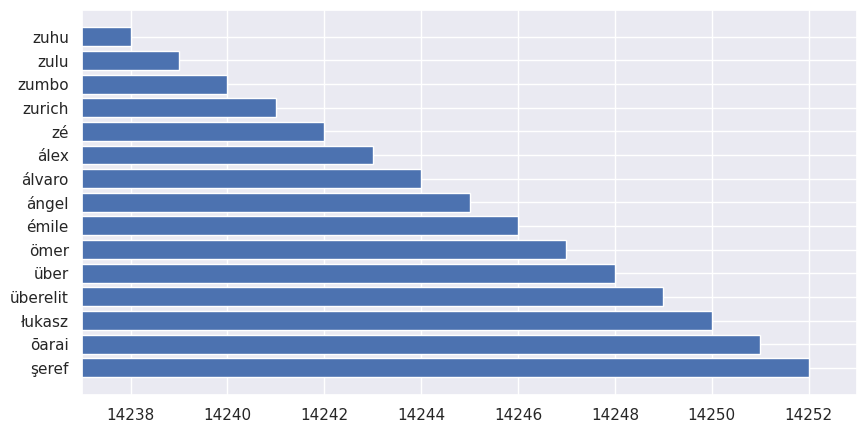

In [ ]:
plt.figure(figsize=(10,5))
plt.barh(top_words_after, top_words_count_after)
plt.xlim(14237, 14253)
plt.show()

In [ ]:
# adding new column length of description

df_copy['length(desc)'] = df_copy['description'].apply(lambda x: len(x))

Listed_in column

In [ ]:
# removing punctuations from listed_in column

df_copy['listed_in'] = df_copy['listed_in'].apply(remove_punct)

In [ ]:
# removing stopwords from listed_in column

df_copy['listed_in'] = df_copy['listed_in'].apply(delete_stopwords)

In [ ]:
# creating the countvectorizer 

count_vect = CountVectorizer()
count_vect.fit(df['listed_in'])
dict_listed = count_vect.vocabulary_.items()
dict_listed

dict_items([('international', 20), ('tv', 43), ('shows', 35), ('dramas', 12), ('sci', 32), ('fi', 17), ('fantasy', 15), ('movies', 25), ('horror', 18), ('action', 0), ('adventure', 1), ('independent', 19), ('mysteries', 28), ('thrillers', 42), ('crime', 8), ('docuseries', 11), ('documentaries', 10), ('sports', 38), ('comedies', 6), ('anime', 2), ('series', 34), ('reality', 30), ('romantic', 31), ('science', 33), ('nature', 29), ('british', 3), ('korean', 22), ('music', 26), ('musicals', 27), ('lgbtq', 24), ('faith', 13), ('spirituality', 37), ('kids', 21), ('spanish', 36), ('language', 23), ('children', 4), ('family', 14), ('classic', 5), ('cult', 9), ('stand', 39), ('up', 44), ('comedy', 7), ('talk', 40), ('teen', 41), ('features', 16)])

In [ ]:
vocab = [ ]
count_vocab = []

for key, value in dict_listed:
  vocab.append(key)
  count_vocab.append(value)

In [ ]:
vocab_listed_stem = pd.DataFrame({'word': vocab, 'count': count_vocab})

vocab_listed_stem = vocab_listed_stem.sort_values('count', ascending=False)

In [ ]:
top_listed_vocab = vocab_listed_stem.head(15)

top_listed_words = top_listed_vocab.word.values
top_listed_words

array(['up', 'tv', 'thrillers', 'teen', 'talk', 'stand', 'sports',
       'spirituality', 'spanish', 'shows', 'series', 'science', 'sci',
       'romantic', 'reality'], dtype=object)

In [ ]:
top_listed_words_count = top_listed_vocab['count'].values
top_listed_words_count

array([44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30])

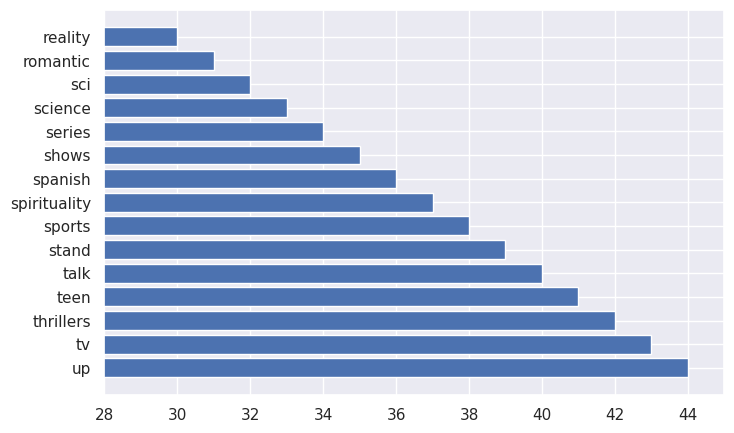

In [ ]:
plt.figure(figsize=(8,5))
plt.barh(top_listed_words, top_listed_words_count)
plt.xlim(28, 45)
plt.show()

**stemming**

In [ ]:
# stemming

df_copy['listed_in'] = df_copy['listed_in'].apply(stemming)
df_copy['listed_in'][0:2]

0    intern tv show tv drama tv scifi fantasi
1                           drama intern movi
Name: listed_in, dtype: object

**TF-IDF Vectorization**

In [ ]:
# creating the object for Tfidf Vectorizer

tfid_vect = TfidfVectorizer()
tfid_vect.fit(df_copy['listed_in'])
dict_listed = tfid_vect.vocabulary_.items()
dict_listed

dict_items([('intern', 18), ('tv', 39), ('show', 31), ('drama', 11), ('scifi', 29), ('fantasi', 14), ('movi', 22), ('horror', 16), ('action', 0), ('adventur', 1), ('independ', 17), ('mysteri', 24), ('thriller', 38), ('crime', 7), ('docuseri', 10), ('documentari', 9), ('sport', 34), ('comedi', 6), ('anim', 2), ('seri', 30), ('realiti', 26), ('romant', 27), ('scienc', 28), ('natur', 25), ('british', 3), ('korean', 20), ('music', 23), ('lgbtq', 21), ('faith', 12), ('spiritu', 33), ('kid', 19), ('spanishlanguag', 32), ('children', 4), ('famili', 13), ('classic', 5), ('cult', 8), ('standup', 35), ('talk', 36), ('teen', 37), ('featur', 15)])

In [ ]:
vocab = [ ]
count_vocab = []

for key, value in dict_listed:
  vocab.append(key)
  count_vocab.append(value)

In [ ]:
vocab_listed_after_stem = pd.DataFrame({'word': vocab, 'count': count_vocab})

vocab_listed_after_stem = vocab_listed_after_stem.sort_values('count', ascending=False)

In [ ]:
top_listed_after_vocab = vocab_listed_after_stem.head(15)
top_listed_after_words = top_listed_after_vocab.word.values
top_listed_after_words

array(['tv', 'thriller', 'teen', 'talk', 'standup', 'sport', 'spiritu',
       'spanishlanguag', 'show', 'seri', 'scifi', 'scienc', 'romant',
       'realiti', 'natur'], dtype=object)

In [ ]:
top_listed_after_words_count = top_listed_after_vocab['count'].values
top_listed_after_words_count

array([39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25])

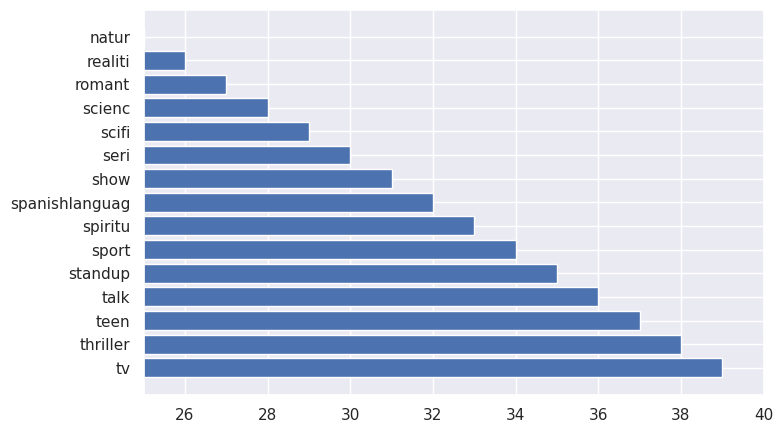

In [ ]:
plt.figure(figsize=(8,5))
plt.barh(top_listed_after_words, top_listed_after_words_count)
plt.xlim(25, 40)
plt.show()

In [ ]:
# adding new column length of listed_in

df_copy['length(list)'] = df_copy['listed_in'].apply(lambda x:len(x))

##### Which text normalization technique have you used and why?

* Removing Stopwords
* Removing Punctuations
* Lowering the case
* Text Vectorization (Count & TF-IDF)
* Stemming (Snowball Stemmer)

* This are the techniques we have used for the text normalization, we have used snowball stemmer for stemming. It is used for reducing a word to its base word or stem in such a way that the words of similar kind lie under a common stem.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features

# crating the feature variable

feature = df_copy[['no_category', 'length(desc)', 'length(list)']]

### 2. Data Scaling

In [ ]:
# Scaling your data
scaler = preprocessing.StandardScaler()

x_scale = scaler.fit_transform(feature)
X = x_scale
silhouette_score_ = []
range_cluster = [i for i in range(2,18)]

##### Which method have you used to scale you data and why?

* We have used the StandardScaler() method for the scaling the data

## ***7. ML Model Implementation*** ✍📈

### ML Model - Silhouette Score

In [ ]:
# ML Model - 1 Implementation

for clusters in range_cluster:
  Kmean_cluster = KMeans(n_clusters = clusters)
  pred = Kmean_cluster.fit_predict(X)
  center = Kmean_cluster.cluster_centers_

  score = silhouette_score(X, pred)
  silhouette_score_.append([int(clusters), round(score, 3)])
  print('For n_clusters = {}, silhouette score {}'. format(clusters, score))

For n_clusters = 2, silhouette score 0.428330622007999
For n_clusters = 3, silhouette score 0.3833404113146566
For n_clusters = 4, silhouette score 0.3750290605467934
For n_clusters = 5, silhouette score 0.3723646700126952
For n_clusters = 6, silhouette score 0.3683748498290538
For n_clusters = 7, silhouette score 0.3761908257010976
For n_clusters = 8, silhouette score 0.3690640404503077
For n_clusters = 9, silhouette score 0.3748833262534343
For n_clusters = 10, silhouette score 0.3651140028726889
For n_clusters = 11, silhouette score 0.35711188814631667
For n_clusters = 12, silhouette score 0.35215264241382854
For n_clusters = 13, silhouette score 0.3504434336338074
For n_clusters = 14, silhouette score 0.3363978637226625
For n_clusters = 15, silhouette score 0.342872253625813
For n_clusters = 16, silhouette score 0.34318854284162953
For n_clusters = 17, silhouette score 0.3370693922299854


In [ ]:
clust = pd.DataFrame(silhouette_score_, columns=['n clusters', 'silhouette score'])
clust = clust.sort_values('silhouette score', ascending=False)
clust.head()

,n clusters,silhouette score
0,2,0.428
1,3,0.383
5,7,0.376
2,4,0.375
7,9,0.375


For n_clusters = 2 The avg silhouette_score is : 0.42818228196866304
For n_clusters = 3 The avg silhouette_score is : 0.3833404113146566
For n_clusters = 4 The avg silhouette_score is : 0.37408977621845363
For n_clusters = 5 The avg silhouette_score is : 0.371496187885102
For n_clusters = 6 The avg silhouette_score is : 0.36840519251771076
For n_clusters = 7 The avg silhouette_score is : 0.3761908257010976
For n_clusters = 8 The avg silhouette_score is : 0.37086420279041005
For n_clusters = 9 The avg silhouette_score is : 0.3753152075151868
For n_clusters = 10 The avg silhouette_score is : 0.363788154384325
For n_clusters = 11 The avg silhouette_score is : 0.35757238143006653
For n_clusters = 12 The avg silhouette_score is : 0.3555579895392461
For n_clusters = 13 The avg silhouette_score is : 0.34824721951037635
For n_clusters = 14 The avg silhouette_score is : 0.3491073103702835
For n_clusters = 15 The avg silhouette_score is : 0.34467016714974424
For n_clusters = 16 The avg silhouett

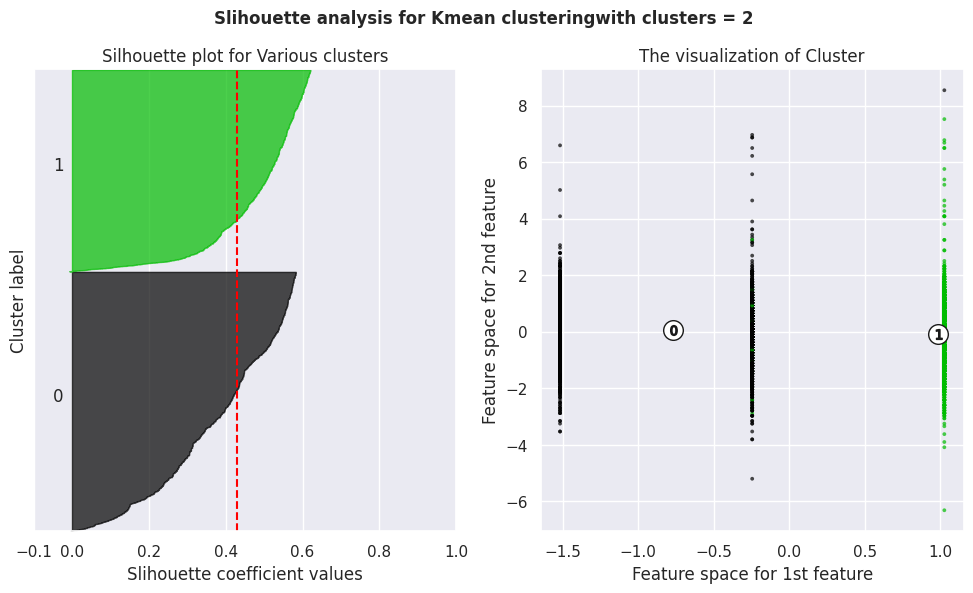

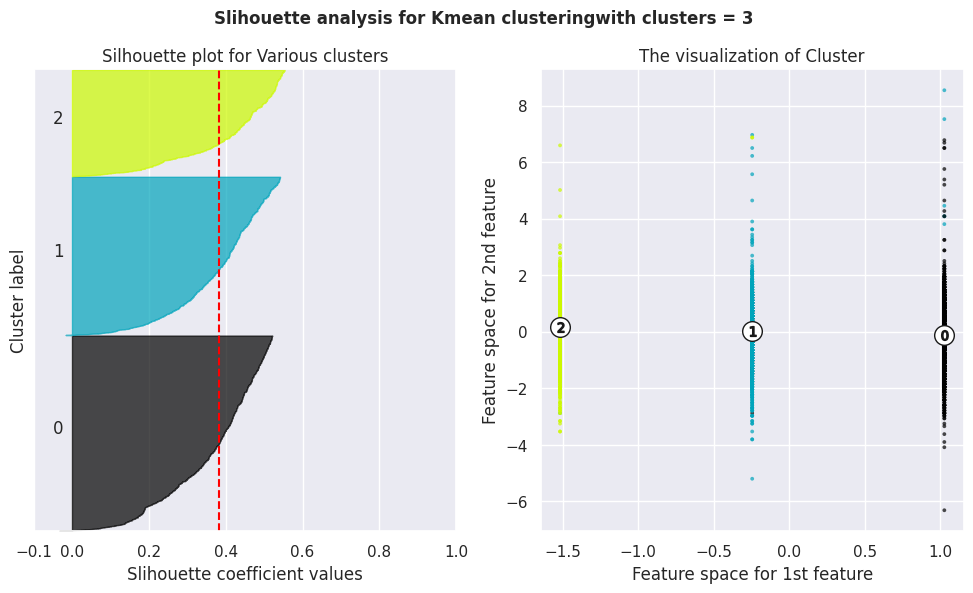

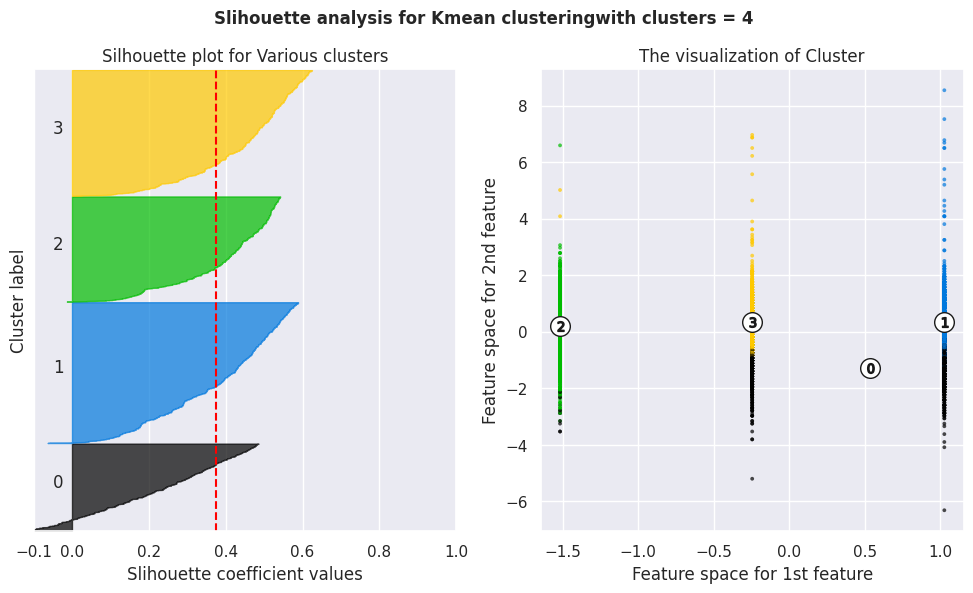

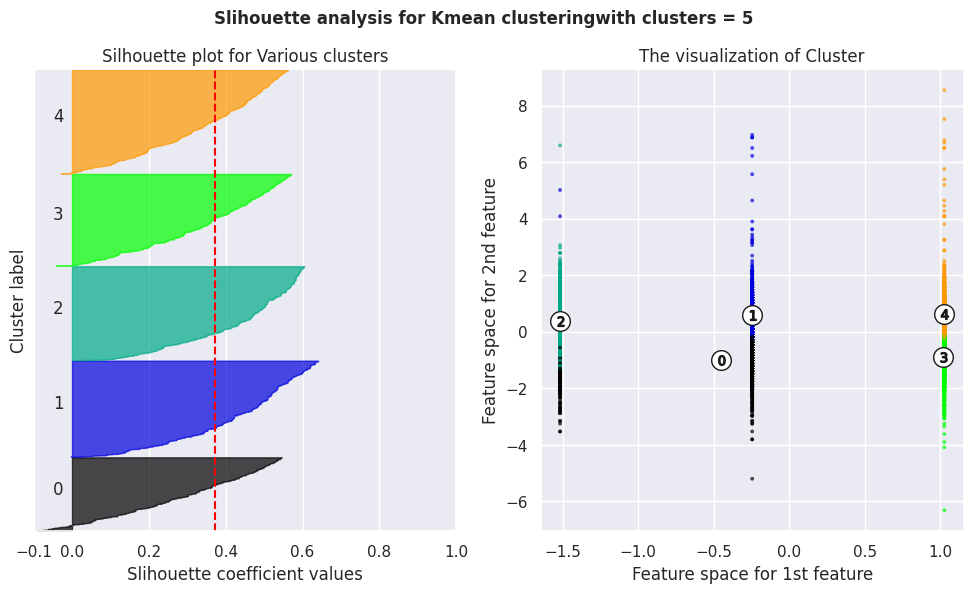

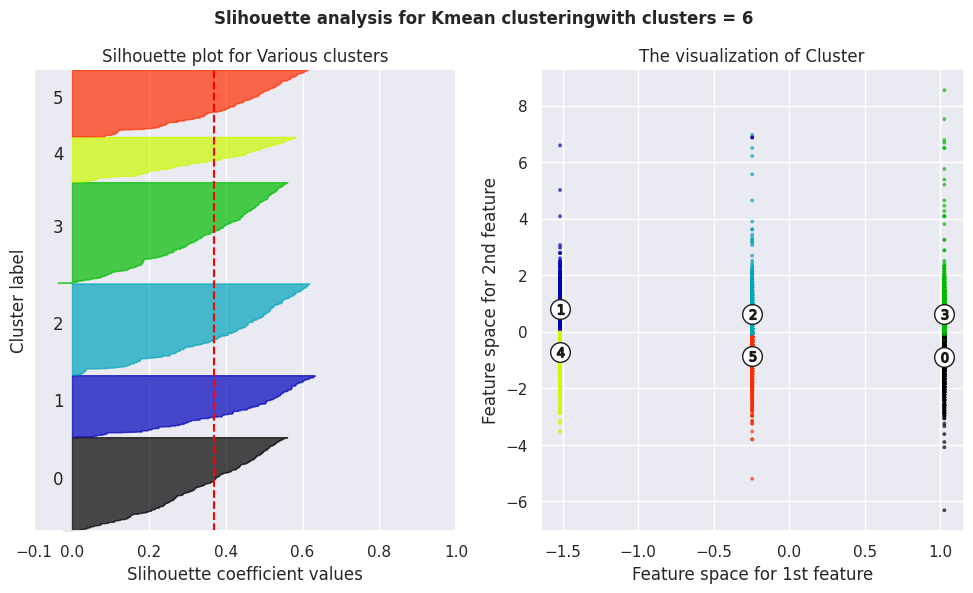

...

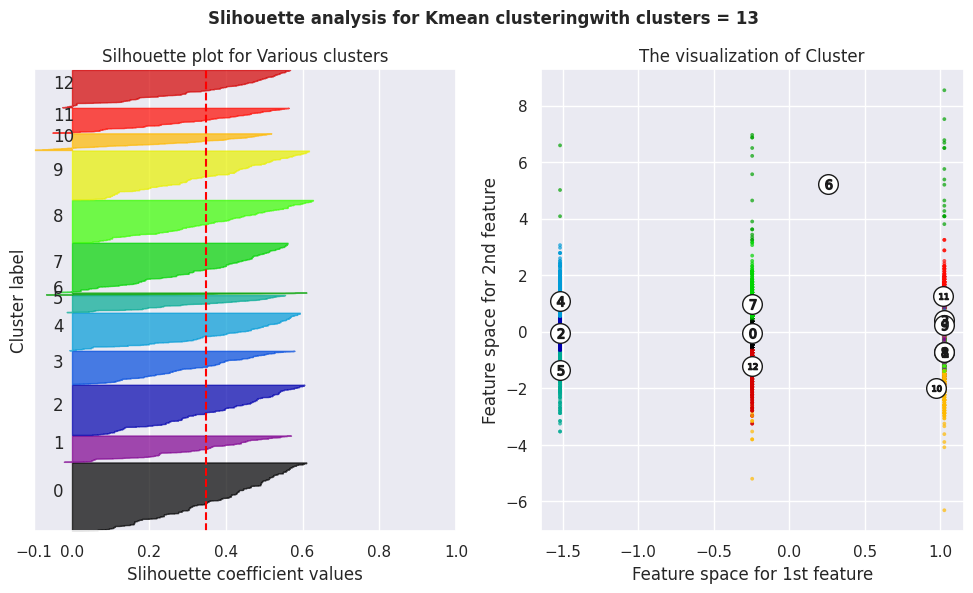

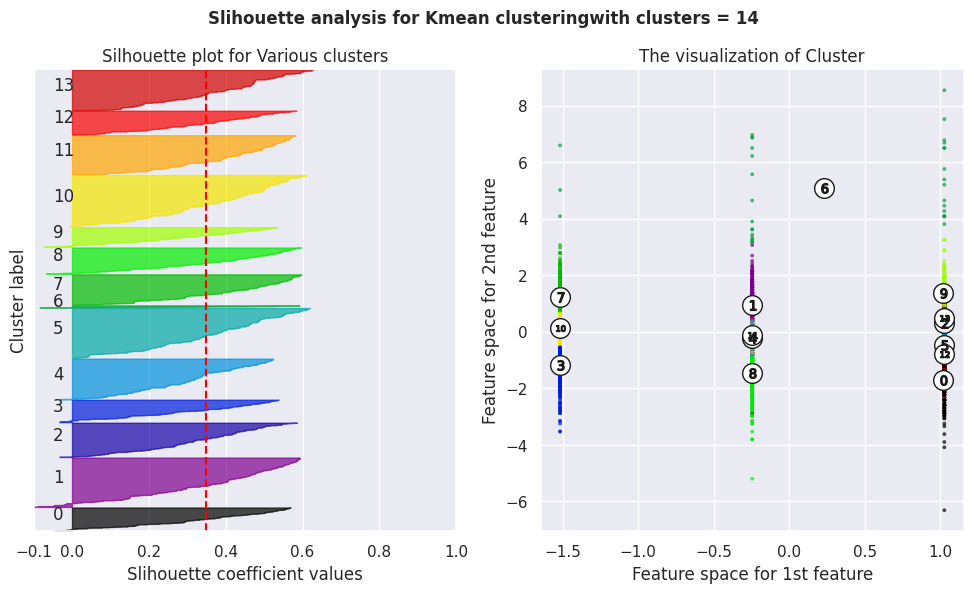

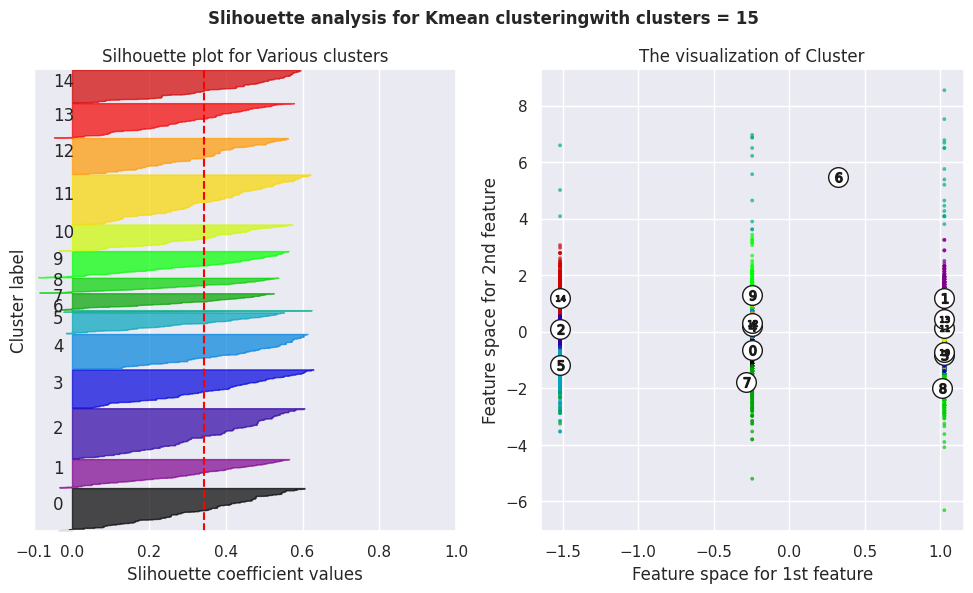

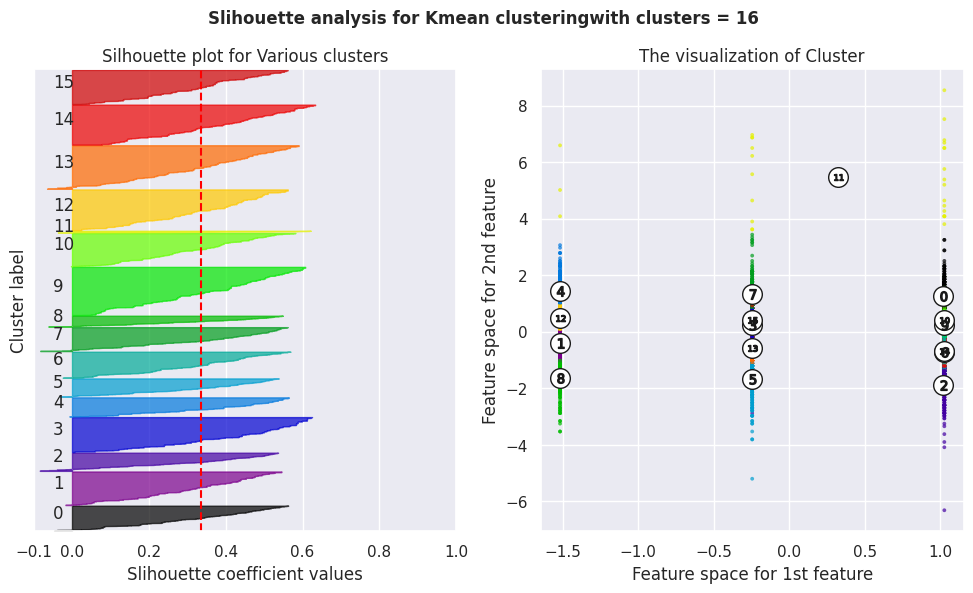

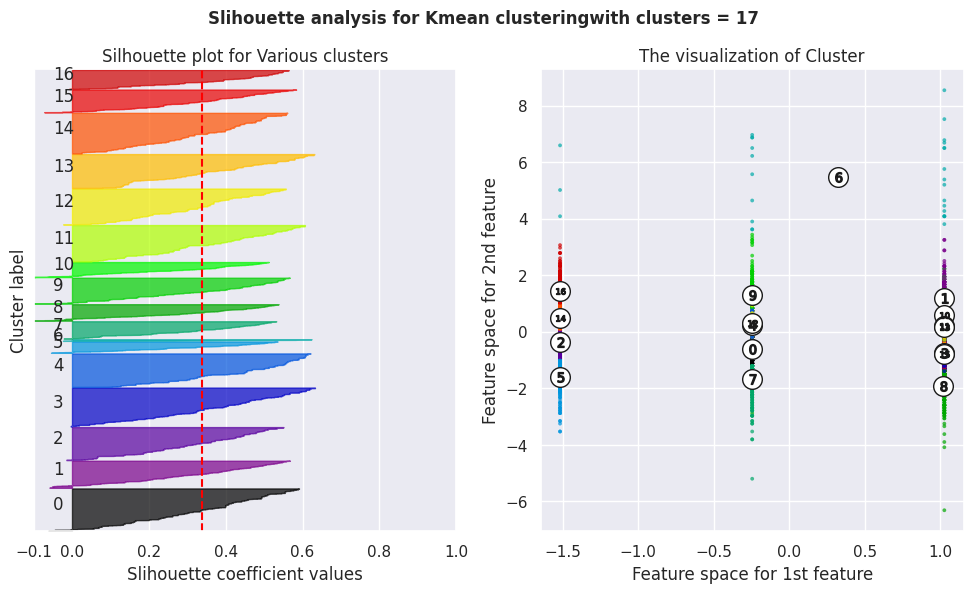

In [ ]:
range_cluster = [i for i in range(2,18)]

for clusters in range_cluster:
  fig, (ax1, ax2) = plt.subplots(1,2)  # creating the subplot
  fig.set_size_inches(12,6)

  ax1.set_xlim([-0.1, 1])  # 1st subplot is silhouette plot
  ax1.set_ylim([0, len(X)+(clusters+1)*10])

  Kmean_cluster = KMeans(n_clusters=clusters, random_state=10)
  clust_labels = Kmean_cluster.fit_predict(X)

  # average values for silhouette score
  silhouette_avg = silhouette_score(X, clust_labels)
  print('For n_clusters =', clusters, 'The avg silhouette_score is :', silhouette_avg)

  # silhiuette score for each sample
  sample_silhouette_values = silhouette_samples(X, clust_labels)

  y_lower = 10
  for i in range(clusters):
    ith_cluster_silhouette_values = sample_silhouette_values[clust_labels == i]

    ith_cluster_silhouette_values.sort()

    size_clust_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_clust_i

    color = cm.nipy_spectral(float(i)/clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    
    ax1.text(-0.05, y_lower + 0.5 * size_clust_i, str(i))
    y_lower = y_upper + 10

  ax1.set_title('Silhouette plot for Various clusters')
  ax1.set_xlabel('Slihouette coefficient values')
  ax1.set_ylabel('Cluster label')

  ax1.axvline(x=silhouette_avg, color='red', linestyle='--')
  ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
  ax1.set_yticks([])

  # 2nd subplot showing the actual cluster
  color = cm.nipy_spectral(clust_labels.astype(float)/clusters)
  ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=color, edgecolor='k')

  center = Kmean_cluster.cluster_centers_
  ax2.scatter(center[:, 0], center[:, 1], marker='o', c='white', alpha=1, s=200, edgecolor='k')

  for n, c in enumerate(center):
      ax2.scatter(c[0], c[1], marker="$%d$" % n, alpha=1, s=50, edgecolor='k')

  ax2.set_title('The visualization of Cluster')
  ax2.set_xlabel('Feature space for 1st feature')
  ax2.set_ylabel('Feature space for 2nd feature')
  plt.suptitle(('Slihouette analysis for Kmean clustering' 
                'with clusters = %d' % clusters), fontsize=12, fontweight='bold')

plt.show()

####  Explain the ML Model used and it's performance by visualization Evaluation.

In [ ]:
# Visualizing evaluation

kmean = KMeans(n_clusters=17, init = 'k-means++', random_state=50)
y_pred = kmean.fit_predict(X)

# silhouette score
score = silhouette_score(X, y_pred)
print('Silhouette score is {}'.format(score))

Silhouette score is 0.33763376306951465


In [ ]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(X, y_pred)

0.8856805294712364

<Axes: xlabel='cluster', ylabel='count'>

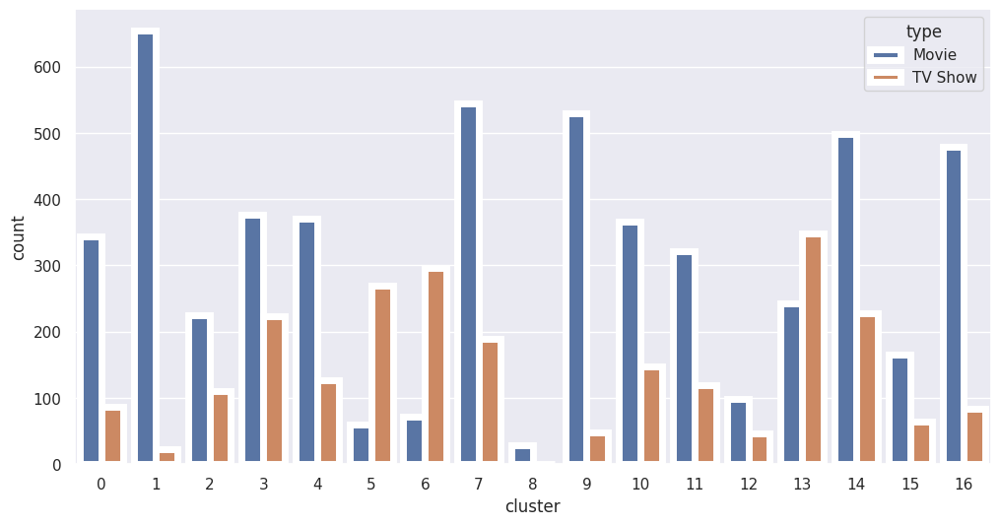

In [ ]:
df_copy['cluster'] = y_pred
plt.figure(figsize=(12,6))
sns.countplot(x='cluster', hue ='type', lw=5, data=df_copy)

Cluster one has highest number of data point for movies and for TV Shows cluster number 13 content highest clusters.

* Slihouette score is used to evaluate the quality of clusters that crated by using clustering algorithms such as K-means. It shows the how well samples are clustered with other samples that are similar to each other.
* Silhouette Score can be used to study the separation distance between the resulting clusters. The plot of silhouette shows th a measure of how close each point in one cluster.
* The value of silhouette coefficient is [-1, 1]. A score 1 denotes the data point is very compact within cluster which is good and it far away from the other clusters. The worst value is -1. Values near 0 denotes overlapping cluster.

### ML Model - Elbow Method

In [ ]:
# ML Model - 2 Implementation

# elbow method
sum_sq_dist = {}
for k in range(1,15):
  Kmean = KMeans(n_clusters=k, init='k-means++', max_iter=1000)
  Kmean = Kmean.fit(X)
  sum_sq_dist[k] = Kmean.inertia_

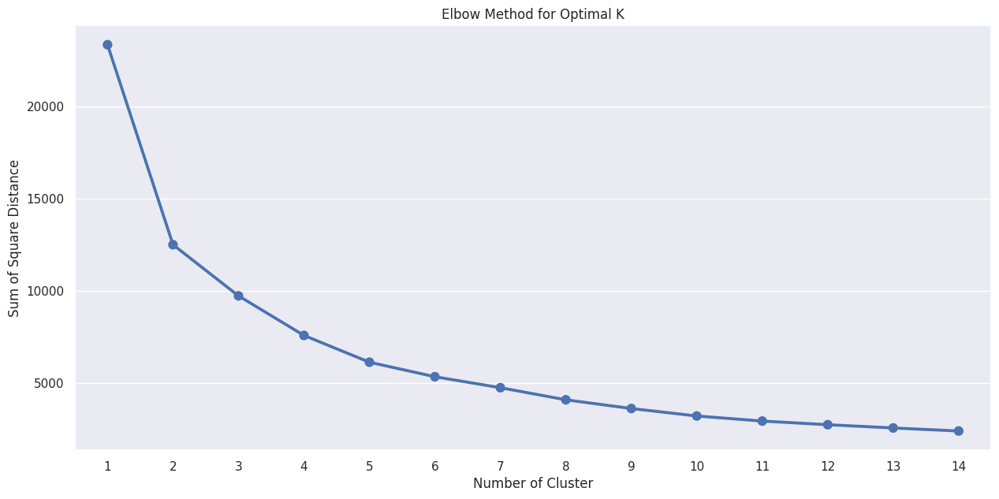

In [ ]:
# plotting the graph for the sum square distance value and no of clusters
sns.pointplot(x=list(sum_sq_dist.keys()), y=list(sum_sq_dist.values()))
plt.xlabel('Number of Cluster')
plt.ylabel('Sum of Square Distance')
plt.title('Elbow Method for Optimal K')
plt.show()

* From the graph we will take number of cluster as 3

In [ ]:
# we will use 3 cluster

Kmean_clust = KMeans(n_clusters = 3)
Kmean_clust.fit(X)
Kmeans = Kmean_clust.predict(X)

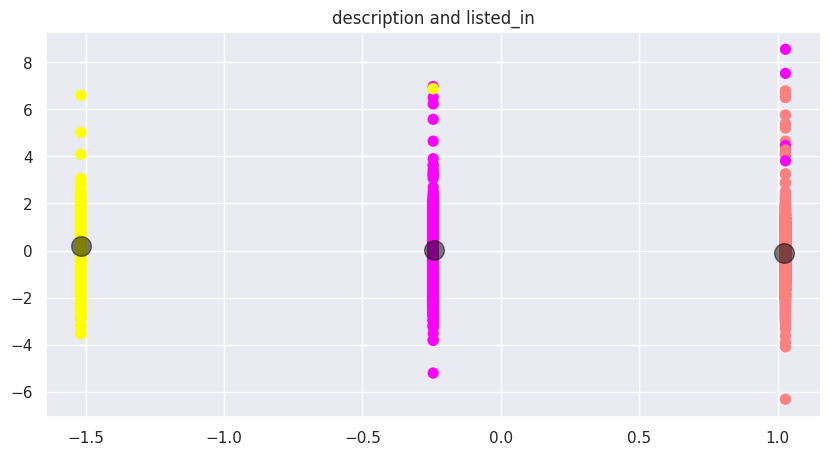

In [ ]:
plt.figure(figsize=(10,5))
plt.title('description and listed_in')
plt.scatter(X[:, 0], X[:, 1], c=Kmeans, s=50, cmap='spring')

centers = Kmean_clust.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
plt.show()

* K-Means elbow visualizer shows the elbow method of selecting the optimal number of cluster for K-Means clustering.
* When all the metrics are plotted. It gives best value for k, the line chart look like an arm and then elbow(the point of inflection on the curve) is the best value of k. The arm can beeither up or down, but if there is strong inflection point then it is good indication that the underlying model fits best at the point.

<B> Contentwise Cluster

In [ ]:
# contentwise clustering for Kmeans

df_copy['clusters'] = Kmean.labels_

def word_count(category):
  print('Exploring Cluster', category)
  column = ['type', 'title', 'country', 'rating', 'listed_in', 'description']
  for i in column:
    word_cloud = df_copy[['clusters',i]].dropna()
    word_cloud = word_cloud[word_cloud['clusters']==category]
    text = ''.join(word for word in word_cloud[i])

    stopwords = set(STOPWORDS)

    wordcloud = WordCloud(stopwords = stopwords, background_color='black',width=1920,height=1080).generate(text)

    plt.rcParams['figure.figsize'] = (10,6)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')

    print('\u001b[1m ''Looking for insight from', i, 'of Movies/TV Show')
    plt.show()

Exploring Cluster 2
 Looking for insight from type of Movies/TV Show


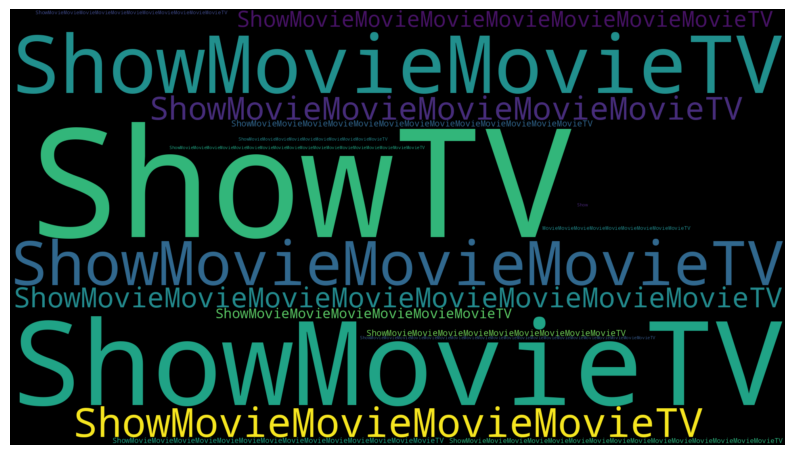

 Looking for insight from title of Movies/TV Show


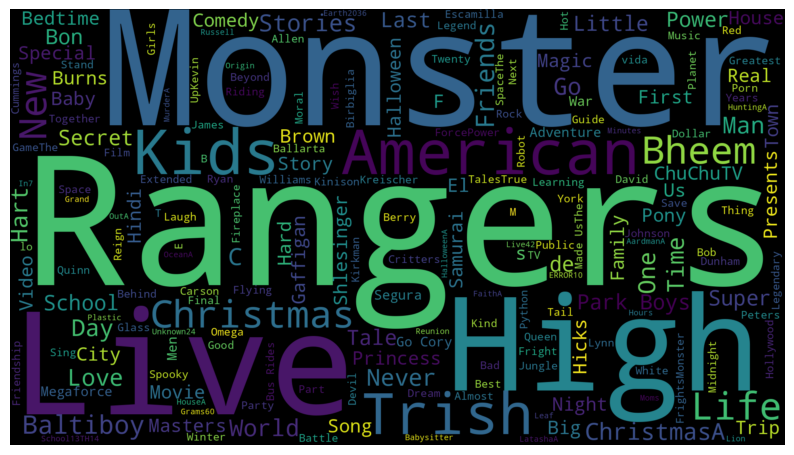

 Looking for insight from country of Movies/TV Show


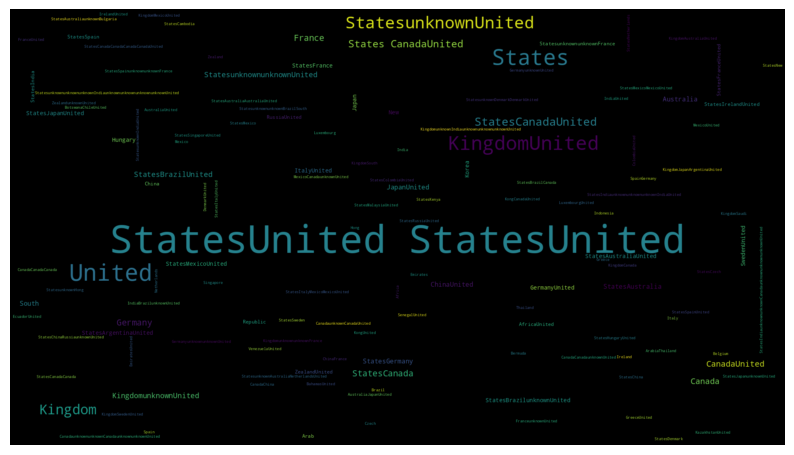

 Looking for insight from rating of Movies/TV Show


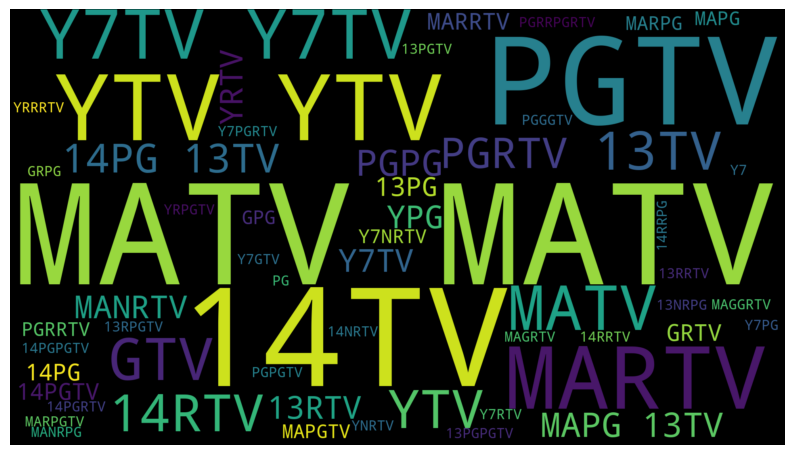

 Looking for insight from listed_in of Movies/TV Show


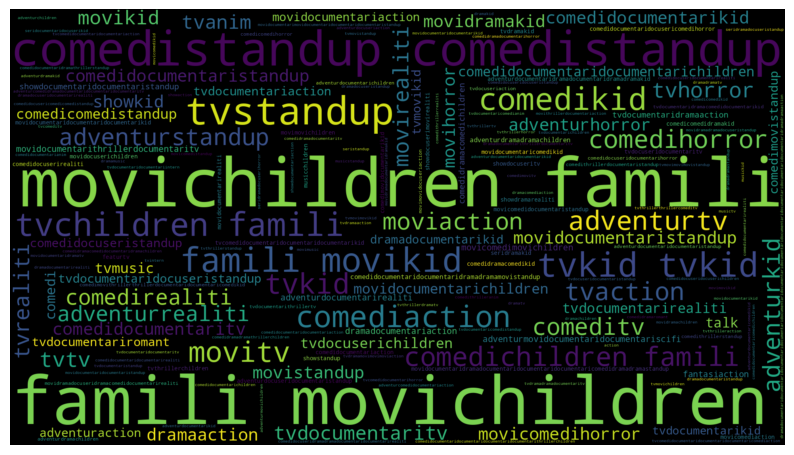

 Looking for insight from description of Movies/TV Show


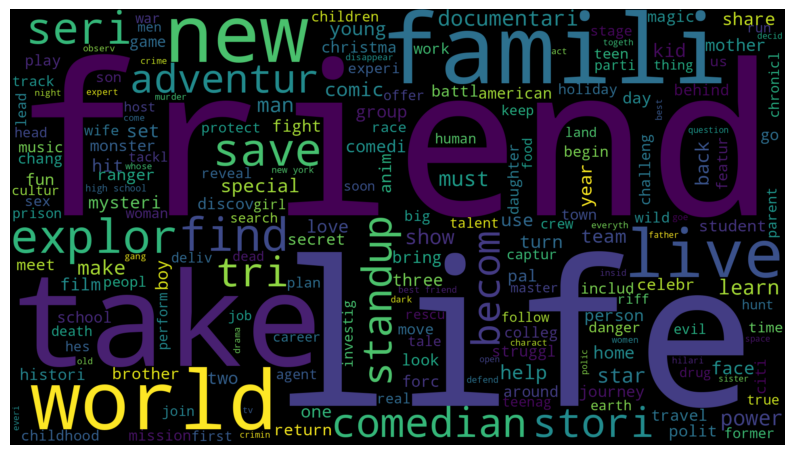

In [ ]:
# worldcloud for cluster 2

word_count(2)

Exploring Cluster 3
 Looking for insight from type of Movies/TV Show


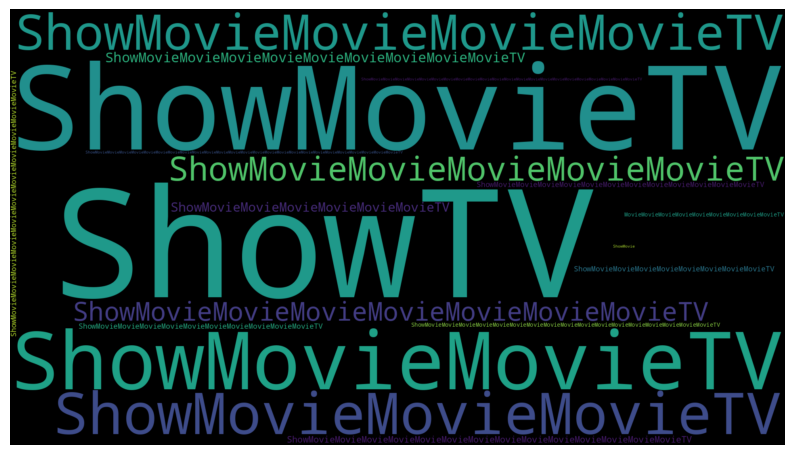

 Looking for insight from title of Movies/TV Show


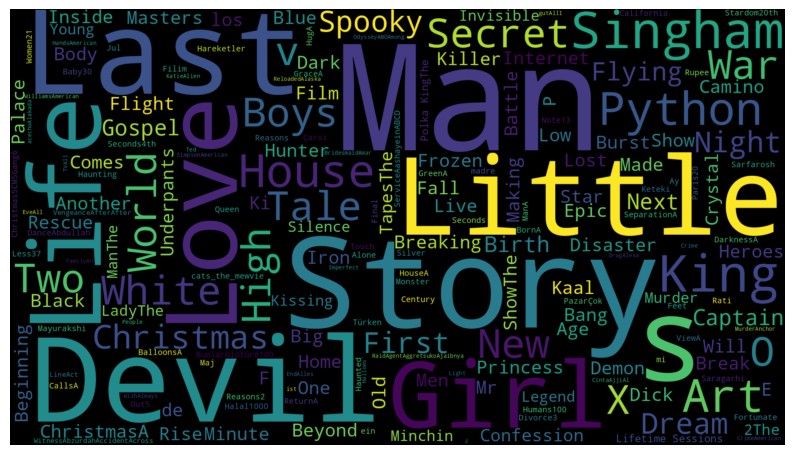

 Looking for insight from country of Movies/TV Show


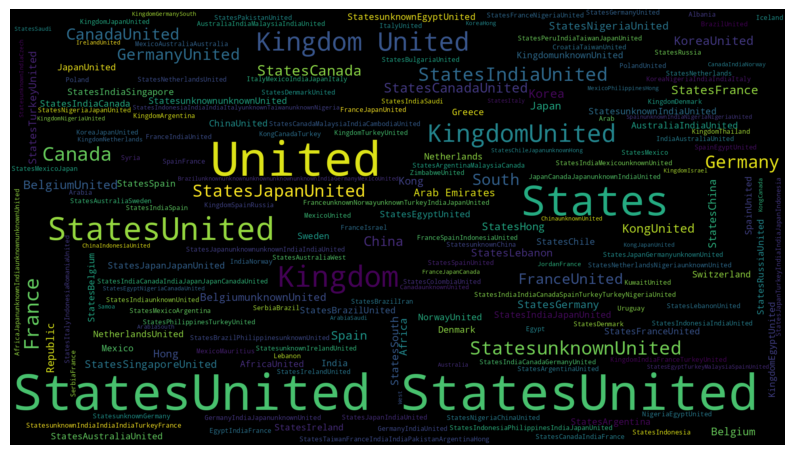

 Looking for insight from rating of Movies/TV Show


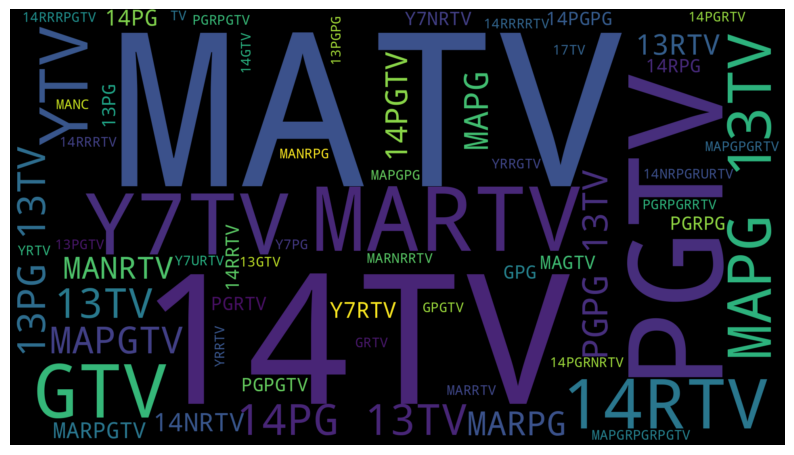

 Looking for insight from listed_in of Movies/TV Show


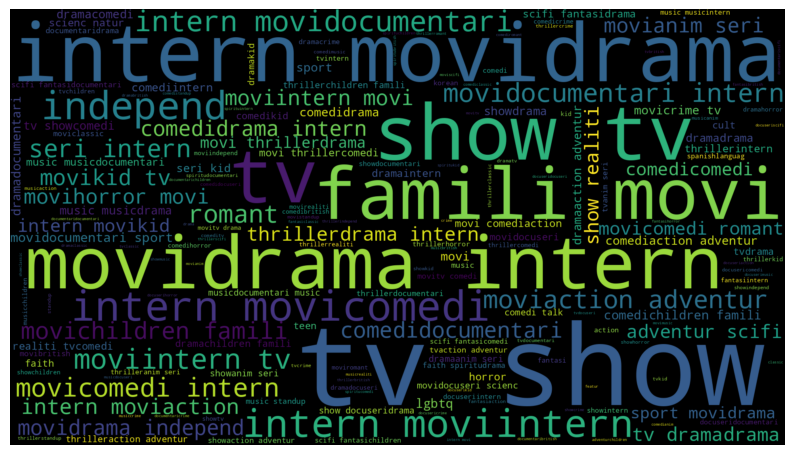

 Looking for insight from description of Movies/TV Show


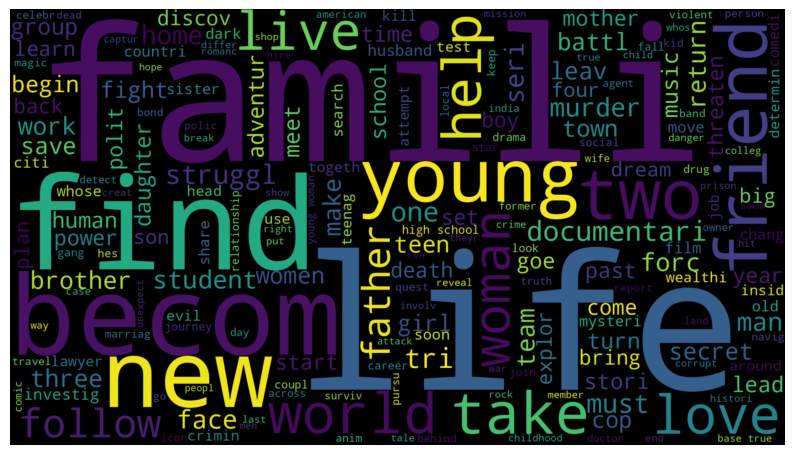

In [ ]:
# worldcloud for cluster 3

word_count(3)

* We have creat the function for building a wordcloud for cloumns as 'type', 'title', 'country', 'rating', 'listed_in', 'description'. using kmeans clustering algorithm

### ML Model - Hierarchical Clustering

In [ ]:
# ML Model - 3 Implementation

import scipy.cluster.hierarchy as sch

hierar = sch.linkage(X, method='ward', metric='euclidean')

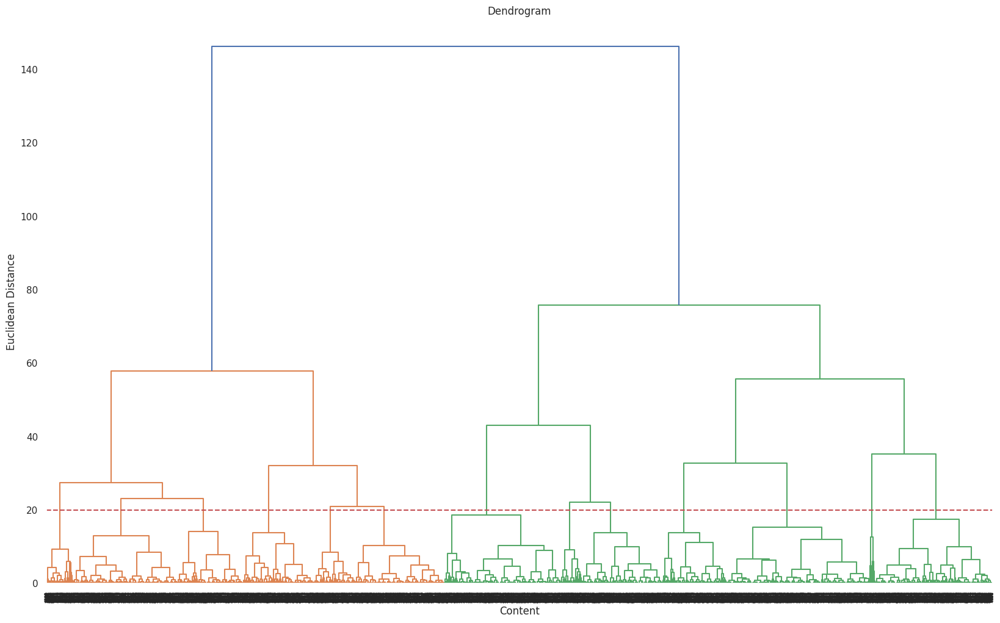

In [ ]:
# Dendogram

plt.figure(figsize=(20,12))
dendo = sch.dendrogram(hierar)
plt.xlabel('Content')
plt.ylabel('Euclidean Distance')
plt.title('Dendrogram')
plt.axhline(y =20, color='r', linestyle='--')
plt.show()

* Dendrogram is tree diagram used to display the relationship between the data points in hierarchical clustering algorithm.

### ML Model - Agglomerative Clustering

In [ ]:
# Agglomerative clustering
from sklearn.cluster import AgglomerativeClustering
hierarchical = AgglomerativeClustering(n_clusters=14, affinity='euclidean', linkage='ward')
y_pre = hierarchical.fit_predict(X)

In [ ]:
# silhouette score
score = silhouette_score(X, y_pre)
print('Silhouette score is {}'.format(score))

Silhouette score is 0.31332127721720376


In [ ]:
davies_bouldin_score(X, y_pre)

0.9280008885803065

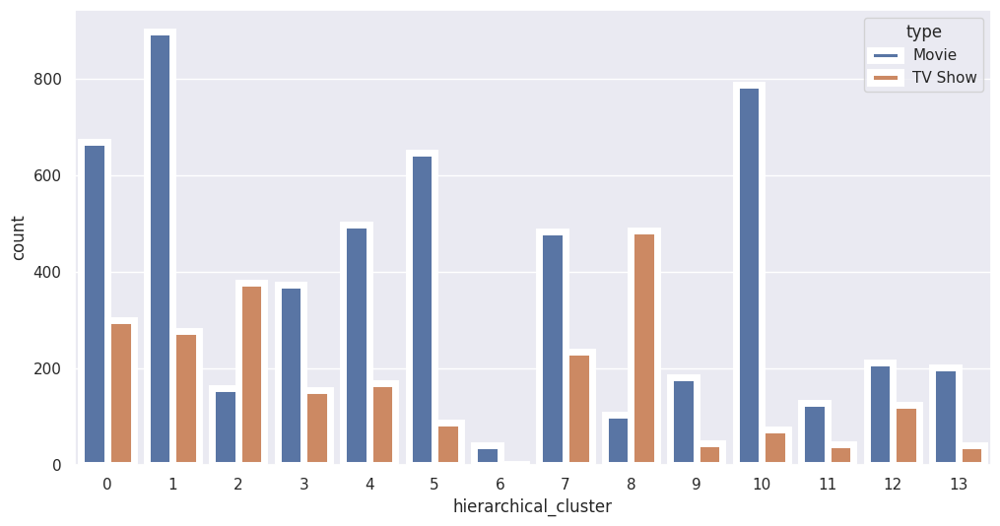

In [ ]:
df_copy['hierarchical_cluster'] = hierarchical.labels_

plt.figure(figsize=(12,6))
sns.countplot(x='hierarchical_cluster',hue ='type', lw=5, data=df_copy)
plt.show()

Cluster one has highest number of data point for movies and for TV Shows cluster number eight content highest clusters.

* We have bulid the cluster using Agglomerative clustering algorithm.
* We build the 14 clusters successfully using agglomerative clustering.

<B> Contentwise Cluster

In [ ]:
# contentwise clustering for hierarchical

df_copy['hierarchical_cluster'] = hierarchical.labels_

def word_count(category):
  print('Exploring Cluster', category)
  column = ['type', 'title', 'country', 'rating', 'listed_in', 'description']
  for i in column:
    word_cloud = df_copy[['hierarchical_cluster',i]].dropna()
    word_cloud = word_cloud[word_cloud['hierarchical_cluster']==category]
    text = ''.join(word for word in word_cloud[i])

    stopwords = set(STOPWORDS)

    wordcloud = WordCloud(stopwords = stopwords, background_color='black',width=1920,height=1080).generate(text)

    plt.rcParams['figure.figsize'] = (10,6)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')

    print('\u001b[1m ''Looking for insight from', i, 'of Movies/TV Show')
    plt.show()

Exploring Cluster 2
 Looking for insight from type of Movies/TV Show


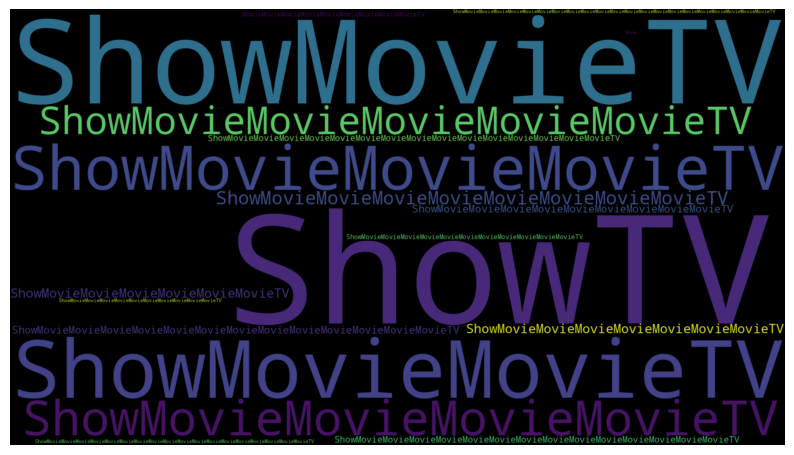

 Looking for insight from title of Movies/TV Show


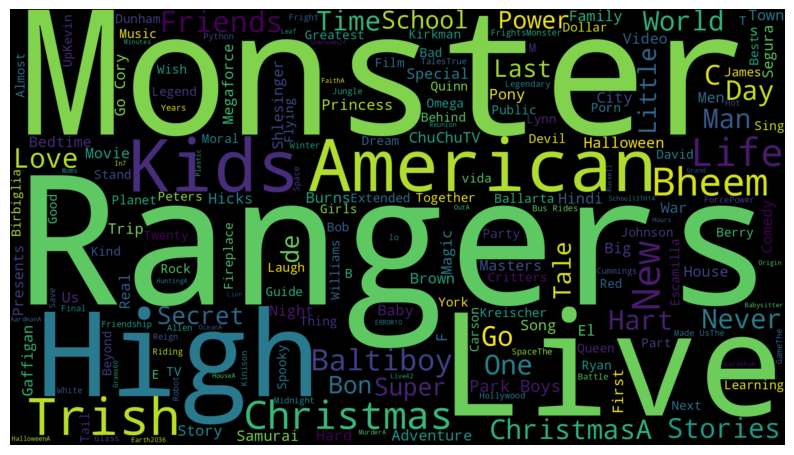

 Looking for insight from country of Movies/TV Show


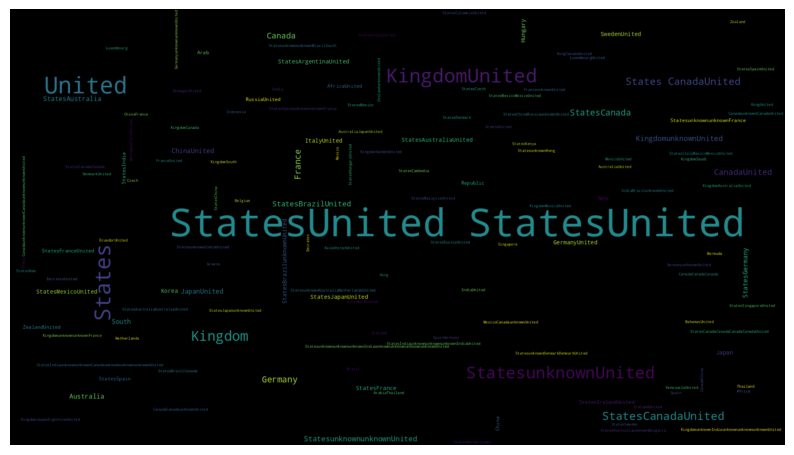

 Looking for insight from rating of Movies/TV Show


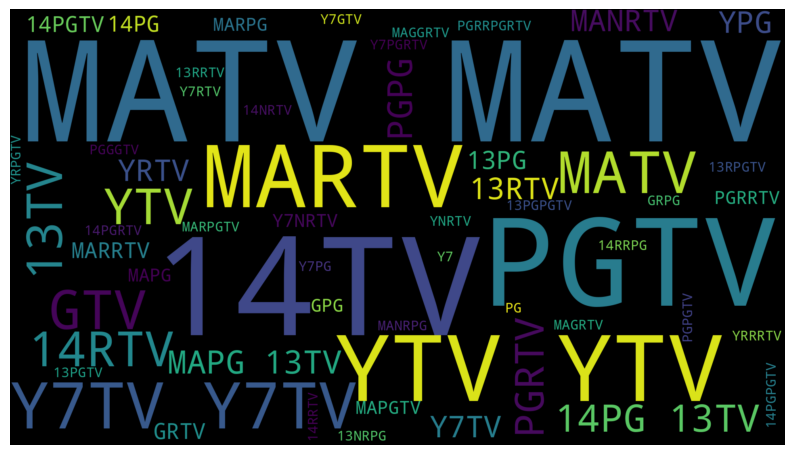

 Looking for insight from listed_in of Movies/TV Show


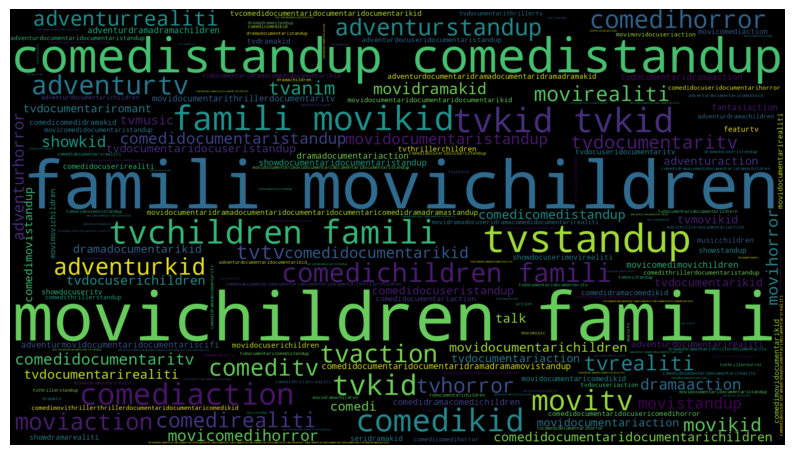

 Looking for insight from description of Movies/TV Show


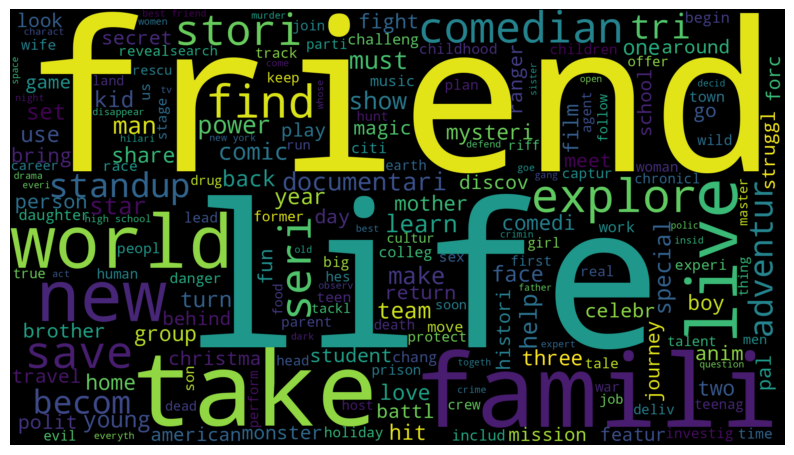

In [ ]:
# worldcloud for cluster 2

word_count(2)

Exploring Cluster 4
 Looking for insight from type of Movies/TV Show


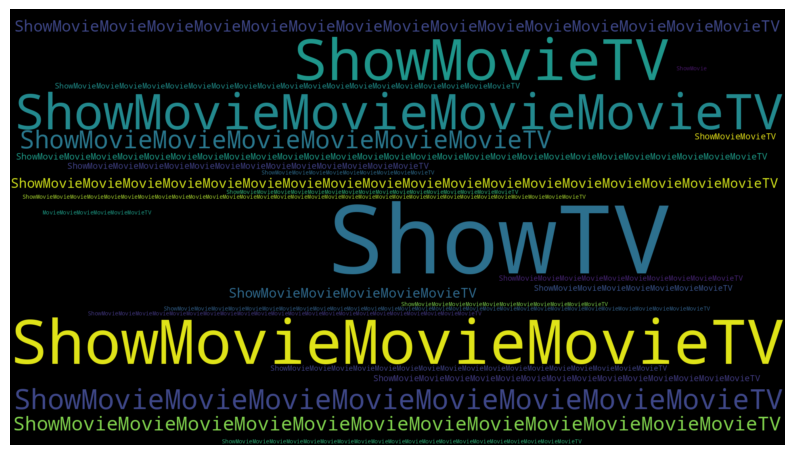

 Looking for insight from title of Movies/TV Show


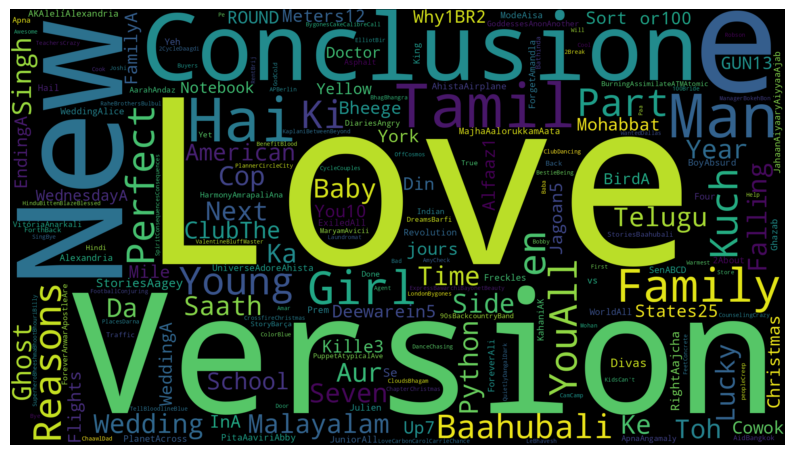

 Looking for insight from country of Movies/TV Show


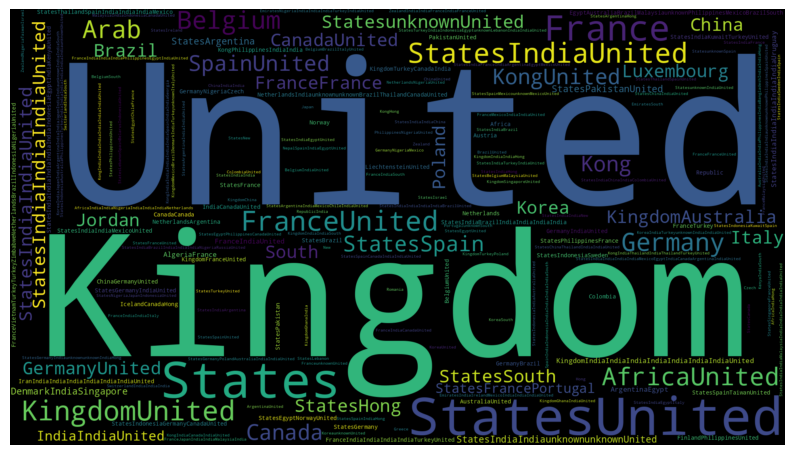

 Looking for insight from rating of Movies/TV Show


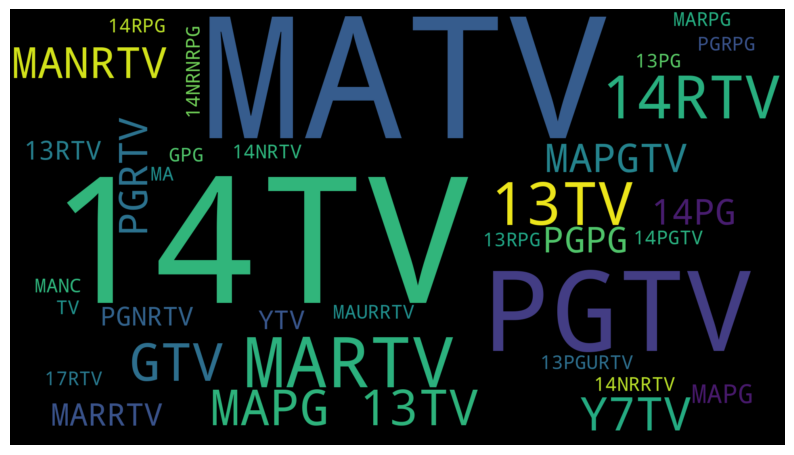

 Looking for insight from listed_in of Movies/TV Show


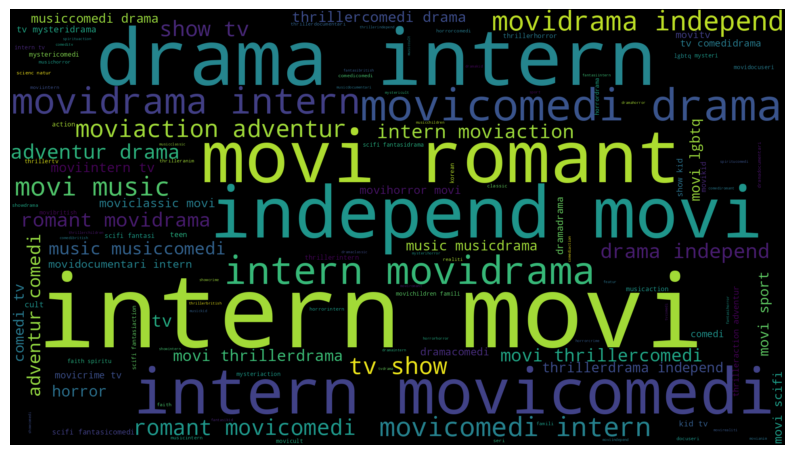

 Looking for insight from description of Movies/TV Show


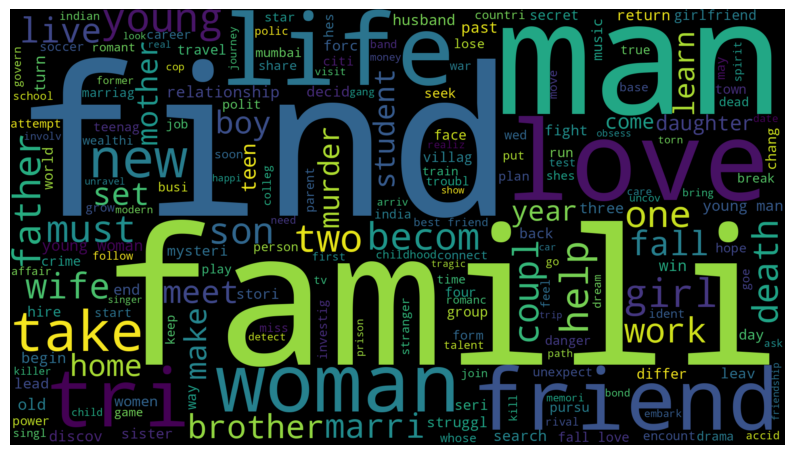

In [ ]:
# worldcloud for cluster 4

word_count(4)

* We have creat the function for building a wordcloud for cloumns as 'type', 'title', 'country', 'rating', 'listed_in', 'description'. using hierarchical clustering algorithm

## **Content Based Recommendation System** 🎥

In [ ]:
# importing libraries

from wordcloud import WordCloud, STOPWORDS
import re, string, unicodedata
import nltk
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import string
string.punctuation
nltk.download('omw-1.4')
from nltk.tokenize import TweetTokenizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
# loading the dataset
recom_df = df.copy()
recom_df.head(5)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
# handling the Null/Missing Values

recom_df[['cast', 'director', 'country']]=recom_df[['cast', 'director', 'country']].fillna('unknown')
recom_df['rating'].fillna(recom_df['rating'].mode()[0], inplace=True)
recom_df.dropna(axis=0, inplace=True)
recom_df.fillna('', inplace=True)

In [ ]:
# wrangling the data

recom_df['country'] = recom_df['country'].apply(lambda x: x.split(',')[0])
recom_df['listed_in'] = recom_df['listed_in'].apply(lambda x: x.split(',')[0])
recom_df['duration'] = recom_df['duration'].apply(lambda x:int(x.split()[0]))

**creating feature**

In [ ]:
# combine the clustering variable in one column

recom_df['clustering_var'] = (recom_df['director']+' '+ recom_df['cast']+' '+
                             recom_df['country']+' '+ recom_df['listed_in']+' '+
                             recom_df['description'])

**Textual Data Preprocessing**

In [ ]:
# Removing the non-ASCII characters

def remove_non_ascii(words):
  new_words = []
  for word in words:
    new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    new_words.append(new_word)
  return new_words

recom_df['clustering_var'] = remove_non_ascii(recom_df['clustering_var'])

In [ ]:
# removing stopwords and lower case

sw = stopwords.words('english')

def stopwords(text):
  text = [word.lower() for word in text.split() if word.lower() not in sw]
  return ' '.join(text)

recom_df['clustering_var'] = recom_df['clustering_var'].apply(stopwords)

In [ ]:
# removing punctuations

def remove_pun(text):
  trans = str.maketrans('', '', string.punctuation)
  return text.translate(trans)

recom_df['clustering_var'] = recom_df['clustering_var'].apply(remove_pun)

In [ ]:
# function to lemmatize the corpus

def lemmatize_verb(words):
  lemmatizer = WordNetLemmatizer()
  lemma = []
  for word in words:
    lemmas = lemmatizer.lemmatize(word, pos='v')
    lemma.append(lemmas)
  return lemma

recom_df['clustering_var'] = lemmatize_verb(recom_df['clustering_var'])

In [ ]:
# tokenization

tokenizer = TweetTokenizer()
recom_df['clustering_var'] = recom_df['clustering_var'].apply(lambda x: tokenizer.tokenize(x))

Preparing data for function

In [ ]:
# changing index from show_id to show title
recom_df['show_id'] = recom_df.index

# convert token to string
def convert(lis):
  return ' '.join(lis)

recom_df['clustering_var'] = recom_df['clustering_var'].apply(lambda x: convert(x))

In [ ]:
# changing the index to title of movies/tv shows
recom_df.set_index('title', inplace =True)

In [ ]:
# count vectorizer
CV = CountVectorizer()
convert_matrix = CV.fit_transform(recom_df['clustering_var'])

In [ ]:
# cosine similarity
cosine_similarity = cosine_similarity(convert_matrix)

**Function for Recommendation system**

In [ ]:
# creating the function to get 10 recommendation for show

indices = pd.Series(recom_df.index)

def recomm_10(title, cos_sim = cosine_similarity):
  try:
    recomm_content = []
    id = indices[indices == title].index[0]
    series = pd.Series(cos_sim[id]).sort_values(ascending=False)
    top_10 = list(series.iloc[1:11].index)

    for i in top_10:
      recomm_content.append(list(recom_df.index)[i])
    print('If you liked {}'.format(title), 'you may also like:\n')
    return recomm_content

  except:
    return 'Invalid Entry'

**Output**

In [ ]:
# checking recommendation system

recomm_10('Stranger Things')

If you liked Stranger Things you may also like:



['Beyond Stranger Things',
 'Tread',
 'Prank Encounters',
 'Zombie Dumb',
 'Kiss Me First',
 'Henry Danger',
 'Living Undocumented',
 'Haunted',
 'Drug Lords',
 'Million Dollar Beach House']

In [ ]:
recomm_10('Zubaan')

If you liked Zubaan you may also like:



['Kacche Dhaagey',
 'Evening Shadows',
 'Jatts in Golmaal',
 'Chauthi Koot',
 'Gelo',
 'Ankur Arora Murder Case',
 'Teshan',
 'Kajraare',
 'Sanju',
 'Manje Bistre']

In [ ]:
recomm_10('Game of Thrones')

'Invalid Entry'

* We have build a simple content based recommendation system based on the similarity of the show.
* To get the similarity score of the contents, we have used cosine similarity
* The similarity of two vectors (A and B) is calculated by taking the dot product of the two vectord and dividing it by the magnitude values.

## ***8.*** ***Future Work***


* From the clustering analysis we can use topic modeling.
* Can be apply different clustering algorithms. More time could be given on clustering analysis.
* Can be improve the recommender system and building a working app on this recommender system.



# **Conclusion** 🤓

In this project we have done work on the text clustering problem where we had group the Netflix shows into clusters such that the content within a cluster are similar to each other and the content that are differnt clusters are dissimilar to each other. We have concluded as follow:

**Exploratory Data Analysis**

* The most content type is from Movies on Netflix. 39% of content is from "TV Show" type and 61% is from "Movies".
* The highest count content on Netflix is made with "TV-MA" rating.
* The country that produced highest number of content is United State followed by India.
* The most popular director with highest number of content directed is Jan Suter
* The most popular actor with highest number of content acted in is Anupam Kher.
* Most of the content from the genre is "International Movies".

**Clustering**

* We have cluster the data before that we have preprocessed the data and then vectorized using countvectorizer and TFIDF vectorizer.
* We have built cluster using K-means clustering algorithm we obtained clusters from Slihouette score and elbow method analysis.
* Then clusters where built on Hierarchical clustering algorithm we have obtained optimal number of clusters after visualizing the dendrogram.

**Recommendation System**

* Then we build content based recommender system using cosine similarity. This recommender system will make 10 recommendation to the user based on the show they watched.

### ***Thank You! We have successfully completed Our Machine Learning Capstone Project !!!***